# **Importing libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from collections import namedtuple
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix,classification_report, roc_auc_score, roc_curve
from sklearn.pipeline import make_pipeline
from sklearn.inspection import permutation_importance

warnings.filterwarnings('ignore')

# **Loading the datasets**

In [2]:
df1 = pd.read_csv("dataset.csv")
pd.set_option('display.max_columns', 100)
df1.head(10)

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,equinox,e,a,q,i,om,w,ma,ad,n,tp,tp_cal,per,per_y,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
0,a0000001,2000001,1 Ceres,1,Ceres,NaN,N,N,3.40,939.400,0.0900,0.200,JPL 47,2458600.5,58600,20190427.0,J2000,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,0.213885,2.458239e+06,2.018043e+07,1683.145703,4.608202,1.594780,620.640533,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,a0000002,2000002,2 Pallas,2,Pallas,NaN,N,N,4.20,545.000,0.1010,18.000,JPL 37,2459000.5,59000,20200531.0,J2000,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,0.213345,2.458321e+06,2.018072e+07,1687.410992,4.619880,1.234290,480.348639,3.193400e-08,4.033700e-09,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,a0000003,2000003,3 Juno,3,Juno,NaN,N,N,5.33,246.596,0.2140,10.594,JPL 112,2459000.5,59000,20200531.0,J2000,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,0.226129,2.458446e+06,2.018112e+07,1592.013769,4.358696,1.034290,402.514639,3.052000e-08,3.471800e-09,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,a0000004,2000004,4 Vesta,4,Vesta,NaN,N,N,3.00,525.400,0.4228,0.200,JPL 35,2458600.5,58600,20190427.0,J2000,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,0.271609,2.458248e+06,2.018051e+07,1325.432763,3.628837,1.139480,443.451432,2.332100e-10,1.514300e-09,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,a0000005,2000005,5 Astraea,5,Astraea,NaN,N,N,6.90,106.699,0.2740,3.140,JPL 114,2459000.5,59000,20200531.0,J2000,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,0.238661,2.458926e+06,2.020032e+07,1508.414421,4.129814,1.095750,426.433027,2.373700e-08,3.970900e-09,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191
5,a0000006,2000006,6 Hebe,6,Hebe,NaN,N,N,5.80,185.180,0.2679,2.900,JPL 89,2459000.5,59000,20200531.0,J2000,0.203219,2.424533,1.931822,14.739653,138.643432,239.736273,190.686496,2.917243,0.261073,2.459649e+06,2.022031e+07,1378.924506,3.775290,0.973673,378.924321,1.978600e-08,2.748200e-09,4.811900e-08,2.191800e-06,1.122100e-05,1.300600e-05,7.392200e-06,3.306700e-09,4.438800e-10,2.875400e-05,2.344500e-06,MBA,0.41032
6,a0000007,2000007,7 Iris,7,Iris,NaN,N,N,5.60,199.830,0.2766,10.000,110,2459000.5,59000,20200531.0,J2000,0.230145,2.387375,1.837933,5.521598,259.563943,145.201545,247.425811,2.936818,0.267192,2.459422e+06,2.021073e+07,1347.347071,3.688835,0.850693,331.064195,1.991900e-08,2.007500e-09,4.748800e-08,2.582500e-06,2.641200e-05,2.707500e-05,7.014700e-06,2.469500e-09,3.370100e-10,2.662700e-05,1.699400e-06,MBA,0.38128
7,a0000008,2000008,8 Flora,8,Flora,NaN,N,N,6.50,147.491,0.2260,1.025,JPL 118,2459000.5,59000,20200531.0,J2000,0.155833,2.201415,1.858362,5.889081,110.876524,285.458915,315.318013,2.544467,0.301753,2.459149e+06,2.020103e+07,1193.029574,3.266337,0.875980,340.905137,2.364400e-08,2.308400e-09,5.176000e-08,3.240300e-06,2.432000e-05,2.664600e-05,1.209200e-05,2.668100e-09,4.746200e-10,4.018700e-05,1.876500e-06,MBA,0.54186
8,a0000009,2000009,9 Metis,9,Metis,NaN,N,N,6.30,190.000,0.1180,NaN,JPL 116,2459000.5,59000,20200531.0,J2000,0.123300,2.386189,2.091972,5.576494,68.909459,6.337325,23.912204,2.680407,0.267391,2.458911e+06,2.020030e+07,1346.343282,3.686087,1.107110,430.853999,1.841400e-08,3.089300e-09,4.425800e-08,2.007400e-06,2.417000e-05,2.600800e-05,1.036600e-05,3.470200e-09,5.192700e-10,

In [3]:
print("Columns \n", df1.columns)
print("Shape \n", df1.shape)

Columns 
 Index(['id', 'spkid', 'full_name', 'pdes', 'name', 'prefix', 'neo', 'pha', 'H',
       'diameter', 'albedo', 'diameter_sigma', 'orbit_id', 'epoch',
       'epoch_mjd', 'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w',
       'ma', 'ad', 'n', 'tp', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld',
       'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w',
       'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class',
       'rms'],
      dtype='object')
Shape 
 (958524, 45)


In [4]:
df2 = pd.read_csv('neov1.csv')
df2.head(10)

,id,name,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,orbiting_body,sentry_object,absolute_magnitude,hazardous
0,2162635,162635 (2000 SS164),1.198271,2.679415,13569.249224,5.483974e+07,Earth,False,16.73,False
1,2277475,277475 (2005 WK4),0.265800,0.594347,73588.726663,6.143813e+07,Earth,False,20.00,True
2,2512244,512244 (2015 YE18),0.722030,1.614507,114258.692129,4.979872e+07,Earth,False,17.83,False
3,3596030,(2012 BV13),0.096506,0.215794,24764.303138,2.543497e+07,Earth,False,22.20,False
4,3667127,(2014 GE35),0.255009,0.570217,42737.733765,4.627557e+07,Earth,False,20.09,True
5,54138696,(2021 GY23),0.036354,0.081291,34297.587778,4.058569e+07,Earth,False,24.32,False
6,54189957,(2021 PY40),0.171615,0.383743,27529.472307,2.906912e+07,Earth,False,20.95,False
7,54230078,(2021 XD6),0.005328,0.011914,57544.470083,5.511502e+07,Earth,False,28.49,False
8,2088213,88213 (2001 AF2),0.350393,0.783502,56625.210122,6.903598e+07,Earth,False,19.40,False
9,3766065,(2016 YM),0.105817,0.236614,48425.840329,3.835526e+07,Earth,False,22.00,False


In [5]:
print("Columns \n", df2.columns)
print("Shape \n", df2.shape)

Columns 
 Index(['id', 'name', 'est_diameter_min', 'est_diameter_max',
       'relative_velocity', 'miss_distance', 'orbiting_body', 'sentry_object',
       'absolute_magnitude', 'hazardous'],
      dtype='object')
Shape 
 (90836, 10)


# **Data Cleaning and Inspection**

**DF1: The Asteroids dataset**

In [6]:
df1 = df1.rename(columns = {
    'e':'eccentricity',
    'a':'semi_major_axis',
    'q':'perihelion_distance',
    'i':'inclination',
    'M':'mean_anomaly',
    'tp': 'time_of_perihelion_passage',
    'n':'mean_motion',
    'Q':'aphelion_distance',
    'class':'classification',
    'per':'period_days',
    'per_y':'period_years'
}).copy()
df1.head(10)

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,equinox,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms
0,a0000001,2000001,1 Ceres,1,Ceres,NaN,N,N,3.40,939.400,0.0900,0.200,JPL 47,2458600.5,58600,20190427.0,J2000,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,0.213885,2.458239e+06,2.018043e+07,1683.145703,4.608202,1.594780,620.640533,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,a0000002,2000002,2 Pallas,2,Pallas,NaN,N,N,4.20,545.000,0.1010,18.000,JPL 37,2459000.5,59000,20200531.0,J2000,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,0.213345,2.458321e+06,2.018072e+07,1687.410992,4.619880,1.234290,480.348639,3.193400e-08,4.033700e-09,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,a0000003,2000003,3 Juno,3,Juno,NaN,N,N,5.33,246.596,0.2140,10.594,JPL 112,2459000.5,59000,20200531.0,J2000,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,0.226129,2.458446e+06,2.018112e+07,1592.013769,4.358696,1.034290,402.514639,3.052000e-08,3.471800e-09,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,a0000004,2000004,4 Vesta,4,Vesta,NaN,N,N,3.00,525.400,0.4228,0.200,JPL 35,2458600.5,58600,20190427.0,J2000,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,0.271609,2.458248e+06,2.018051e+07,1325.432763,3.628837,1.139480,443.451432,2.332100e-10,1.514300e-09,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,a0000005,2000005,5 Astraea,5,Astraea,NaN,N,N,6.90,106.699,0.2740,3.140,JPL 114,2459000.5,59000,20200531.0,J2000,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,0.238661,2.458926e+06,2.020032e+07,1508.414421,4.129814,1.095750,426.433027,2.373700e-08,3.970900e-09,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191
5,a0000006,2000006,6 Hebe,6,Hebe,NaN,N,N,5.80,185.180,0.2679,2.900,JPL 89,2459000.5,59000,20200531.0,J2000,0.203219,2.424533,1.931822,14.739653,138.643432,239.736273,190.686496,2.917243,0.261073,2.459649e+06,2.022031e+07,1378.924506,3.775290,0.973673,378.924321,1.978600e-08,2.748200e-09,4.811900e-08,2.191800e-06,1.122100e-05,1.300600e-05,7.392200e-06,3.306700e-09,4.438800e-10,2.875400e-05,2.344500e-06,MBA,0.41032
6,a0000007,2000007,7 Iris,7,Iris,NaN,N,N,5.60,199.830,0.2766,10.000,110,2459000.5,59000,20200531.0,J2000,0.230145,2.387375,1.837933,5.521598,259.563943,145.201545,247.425811,2.936818,0.267192,2.459422e+06,2.021073e+07,1347.347071,3.688835,0.850693,331.064195,1.991900e-08,2.007500e-09,4.748800e-08,2.582500e-06,2.641200e-05,2.707500e-05,7.014700e-06,2.469500e-09,3.370100e-10,2.662700e-05,1.699400e-06,MBA,0.38128
7,a0000008,2000008,8 Flora,8,Flora,NaN,N,N,6.50,147.491,0.2260,1.025,JPL 118,2459000.5,59000,20200531.0,J2000,0.155833,2.201415,1.858362,5.889081,110.876524,285.458915,315.318013,2.544467,0.301753,2.459149e+06,2.020103e+07,1193.029574,3.266337,0.875980,340.905137,2.364400e-08,2.308400e-09,5.176000e-08,3.240300e-06,2.432000e-05,2.664600e-05,1.209200e-05,2.668100e-09,4.746200e-10,4.018700e-05,1.876500e-06,MBA,0.54186
8,a0000009,2000009,9 Metis,9,Metis,NaN,N,N,6.30,190.000,0.1180,NaN,JPL 116,2459000.5,59000,20200531.0,J2000,0.123300,2.386189,2.091972,5.576494,68.909459,6.337325,23.912204,2.680407,0.267391,2.458911e+06,2.020030e+07,1346.343282,3.686087,1.107110,430.853999,1.8414

Based on the distribution above, 2.39% are NEO's and 97.61% are not NEO's

In [7]:
print(df1['prefix'].unique())
print(df1['prefix'].nunique())
print(df1['equinox'].unique())
print(df1['equinox'].nunique())

[nan 'A']
1
['J2000']
1


In [8]:
df1 = df1.drop(['id','pdes', 'name',
                'prefix', 'equinox'],
                axis='columns', inplace=False)

In [9]:
df1["diameter"] = df1["diameter"].replace(np.NaN, df1[
    "diameter"].mean())
df1["diameter_sigma"] = df1["diameter_sigma"].replace(np.NaN, df1[
    "diameter_sigma"].mean())
df1["albedo"] = df1["albedo"].replace(np.NaN, df1[
    "albedo"].mean())
df1["H"] = df1["H"].replace(np.NaN, df1[
    "H"].mean())

The mean of diameter, diameter_sigma, albedo and absolute_magnitude are used to handle missing values for each of the respective columns.

In [10]:
df1 = df1[df1['sigma_ad'].notna()]
df1 = df1[df1['ma'].notna()]
df1.head()

,spkid,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms
0,2000001,1 Ceres,N,N,3.40,939.400,0.0900,0.200,JPL 47,2458600.5,58600,20190427.0,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,0.213885,2.458239e+06,2.018043e+07,1683.145703,4.608202,1.59478,620.640533,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,2000002,2 Pallas,N,N,4.20,545.000,0.1010,18.000,JPL 37,2459000.5,59000,20200531.0,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,0.213345,2.458321e+06,2.018072e+07,1687.410992,4.619880,1.23429,480.348639,3.193400e-08,4.033700e-09,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,2000003,3 Juno,N,N,5.33,246.596,0.2140,10.594,JPL 112,2459000.5,59000,20200531.0,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,0.226129,2.458446e+06,2.018112e+07,1592.013769,4.358696,1.03429,402.514639,3.052000e-08,3.471800e-09,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,2000004,4 Vesta,N,N,3.00,525.400,0.4228,0.200,JPL 35,2458600.5,58600,20190427.0,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,0.271609,2.458248e+06,2.018051e+07,1325.432763,3.628837,1.13948,443.451432,2.332100e-10,1.514300e-09,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,2000005,5 Astraea,N,N,6.90,106.699,0.2740,3.140,JPL 114,2459000.5,59000,20200531.0,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,0.238661,2.458926e+06,2.020032e+07,1508.414421,4.129814,1.09575,426.433027,2.373700e-08,3.970900e-09,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191


In [11]:
counts = df1.groupby('classification')[
    'pha'].count().reset_index()
counts

,classification,pha
0,AMO,8456
1,APO,12687
2,AST,75
3,ATE,1729
4,CEN,504
5,IEO,22
6,IMB,19903
7,MBA,837430
8,MCA,18356
9,OMB,27815


From the above we can see a breakdown of the distribution of potentially hazardous asteroids across different classifications, helping to understand the prevalence of hazardous asteroids in each orbital category.

In [12]:
df1.head()
df1.rename(columns={'spkid':'id'}, inplace=True)

We rename the column spkid to id so that it would be easy to have a common key id while merging the two datasets.

In [13]:
dataframe_subset = df1[df1.columns[~df1.columns.isin(['id',
                                                      'full_name','neo',
                                                      'pha', 'orbit_id',
                                                      'classification'])]]
df1.head()

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms
0,2000001,1 Ceres,N,N,3.40,939.400,0.0900,0.200,JPL 47,2458600.5,58600,20190427.0,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,0.213885,2.458239e+06,2.018043e+07,1683.145703,4.608202,1.59478,620.640533,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,2000002,2 Pallas,N,N,4.20,545.000,0.1010,18.000,JPL 37,2459000.5,59000,20200531.0,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,0.213345,2.458321e+06,2.018072e+07,1687.410992,4.619880,1.23429,480.348639,3.193400e-08,4.033700e-09,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,2000003,3 Juno,N,N,5.33,246.596,0.2140,10.594,JPL 112,2459000.5,59000,20200531.0,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,0.226129,2.458446e+06,2.018112e+07,1592.013769,4.358696,1.03429,402.514639,3.052000e-08,3.471800e-09,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,2000004,4 Vesta,N,N,3.00,525.400,0.4228,0.200,JPL 35,2458600.5,58600,20190427.0,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,0.271609,2.458248e+06,2.018051e+07,1325.432763,3.628837,1.13948,443.451432,2.332100e-10,1.514300e-09,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,2000005,5 Astraea,N,N,6.90,106.699,0.2740,3.140,JPL 114,2459000.5,59000,20200531.0,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,0.238661,2.458926e+06,2.020032e+07,1508.414421,4.129814,1.09575,426.433027,2.373700e-08,3.970900e-09,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191


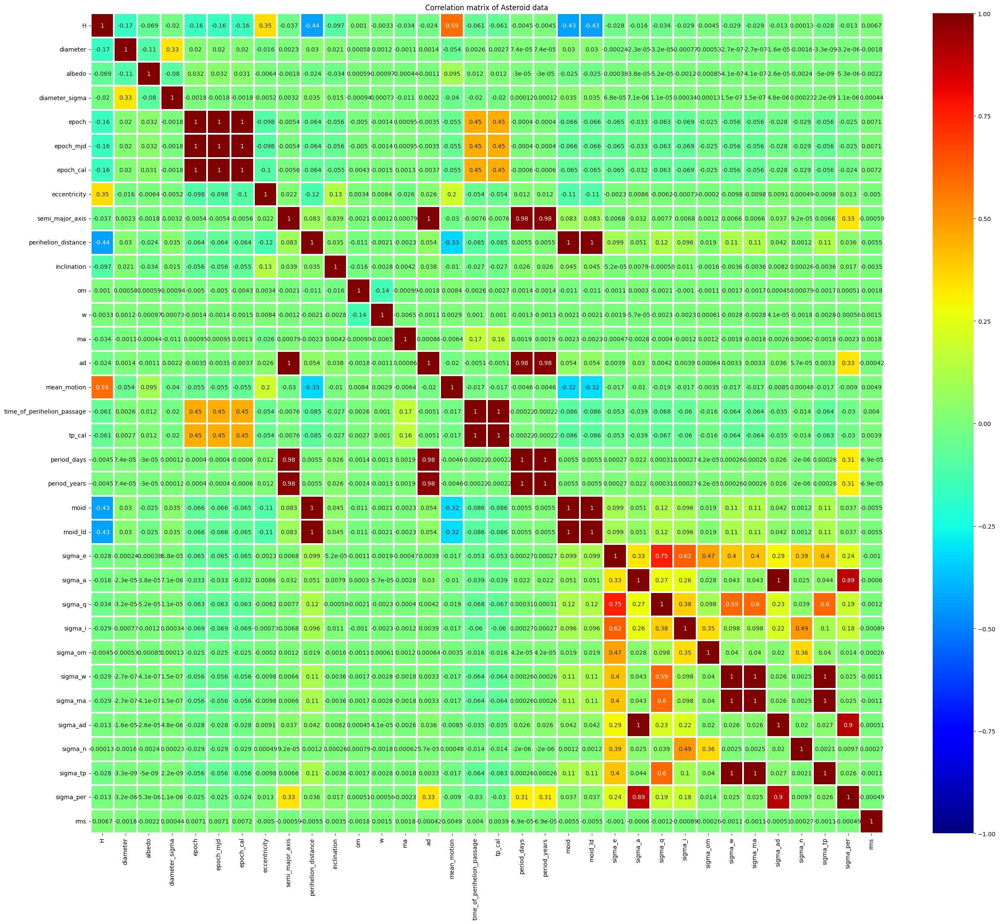

In [14]:
correlation_matrix=dataframe_subset.corr()
plt.figure(figsize=(30,25))
plt.title("Correlation matrix of Asteroid data")
sns.heatmap(data=correlation_matrix,cmap='jet',
            vmin=-1,vmax=1,linewidth=1.5,annot=True)
plt.show()

From the correlation matrix above, it can be inferred that we need to exclude the variables "epoch_mjd" and "epoch_cal" due to their strong correlation with "epoch." Similarly, we are eliminating "sigma_w" and "sigma_a" as well as "a" owing to high correlations between them.

In [15]:
dataframe_subset = dataframe_subset.drop(['epoch_mjd', 'epoch_cal',
                                          'sigma_w','sigma_a','semi_major_axis'],
                                          axis='columns', inplace=False)

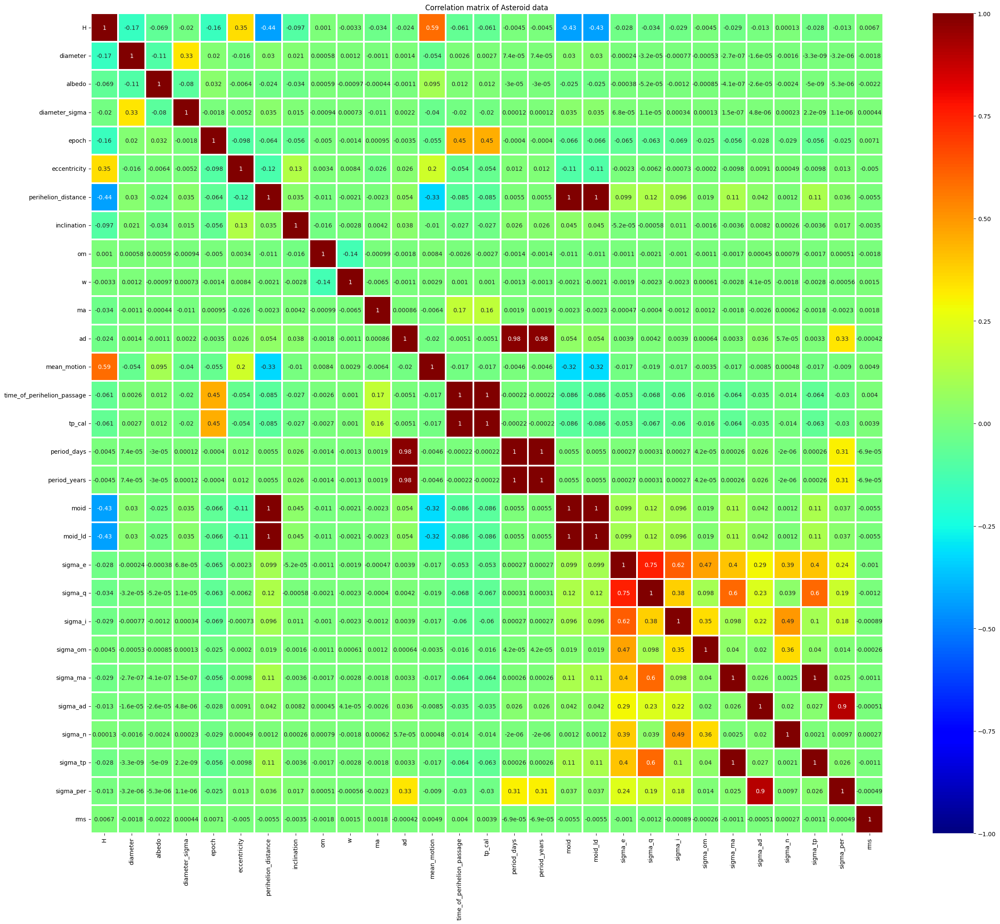

In [16]:
correlation_matrix=dataframe_subset.corr()
plt.figure(figsize=(30,25))
plt.title("Correlation matrix of Asteroid data")
sns.heatmap(data=correlation_matrix,cmap='jet',
            vmin=-1,vmax=1,linewidth=1.5,annot=True)
plt.show()

The above correlation matrix indicates that there are no highly redundant features, and all features appear to have normal correlations with each other.

In [17]:
df1.head(10)

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms
0,2000001,1 Ceres,N,N,3.40,939.400,0.0900,0.200000,JPL 47,2458600.5,58600,20190427.0,0.076009,2.769165,2.558684,10.594067,80.305531,73.597695,77.372098,2.979647,0.213885,2.458239e+06,2.018043e+07,1683.145703,4.608202,1.594780,620.640533,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,2000002,2 Pallas,N,N,4.20,545.000,0.1010,18.000000,JPL 37,2459000.5,59000,20200531.0,0.229972,2.773841,2.135935,34.832932,173.024741,310.202392,144.975675,3.411748,0.213345,2.458321e+06,2.018072e+07,1687.410992,4.619880,1.234290,480.348639,3.193400e-08,4.033700e-09,8.832200e-08,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,2000003,3 Juno,N,N,5.33,246.596,0.2140,10.594000,JPL 112,2459000.5,59000,20200531.0,0.256936,2.668285,1.982706,12.991043,169.851482,248.066193,125.435355,3.353865,0.226129,2.458446e+06,2.018112e+07,1592.013769,4.358696,1.034290,402.514639,3.052000e-08,3.471800e-09,8.139200e-08,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,2000004,4 Vesta,N,N,3.00,525.400,0.4228,0.200000,JPL 35,2458600.5,58600,20190427.0,0.088721,2.361418,2.151909,7.141771,103.810804,150.728541,95.861938,2.570926,0.271609,2.458248e+06,2.018051e+07,1325.432763,3.628837,1.139480,443.451432,2.332100e-10,1.514300e-09,1.928600e-09,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,2000005,5 Astraea,N,N,6.90,106.699,0.2740,3.140000,JPL 114,2459000.5,59000,20200531.0,0.190913,2.574037,2.082619,5.367427,141.571026,358.648418,17.846343,3.065455,0.238661,2.458926e+06,2.020032e+07,1508.414421,4.129814,1.095750,426.433027,2.373700e-08,3.970900e-09,6.092400e-08,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191
5,2000006,6 Hebe,N,N,5.80,185.180,0.2679,2.900000,JPL 89,2459000.5,59000,20200531.0,0.203219,2.424533,1.931822,14.739653,138.643432,239.736273,190.686496,2.917243,0.261073,2.459649e+06,2.022031e+07,1378.924506,3.775290,0.973673,378.924321,1.978600e-08,2.748200e-09,4.811900e-08,2.191800e-06,1.122100e-05,1.300600e-05,7.392200e-06,3.306700e-09,4.438800e-10,2.875400e-05,2.344500e-06,MBA,0.41032
6,2000007,7 Iris,N,N,5.60,199.830,0.2766,10.000000,110,2459000.5,59000,20200531.0,0.230145,2.387375,1.837933,5.521598,259.563943,145.201545,247.425811,2.936818,0.267192,2.459422e+06,2.021073e+07,1347.347071,3.688835,0.850693,331.064195,1.991900e-08,2.007500e-09,4.748800e-08,2.582500e-06,2.641200e-05,2.707500e-05,7.014700e-06,2.469500e-09,3.370100e-10,2.662700e-05,1.699400e-06,MBA,0.38128
7,2000008,8 Flora,N,N,6.50,147.491,0.2260,1.025000,JPL 118,2459000.5,59000,20200531.0,0.155833,2.201415,1.858362,5.889081,110.876524,285.458915,315.318013,2.544467,0.301753,2.459149e+06,2.020103e+07,1193.029574,3.266337,0.875980,340.905137,2.364400e-08,2.308400e-09,5.176000e-08,3.240300e-06,2.432000e-05,2.664600e-05,1.209200e-05,2.668100e-09,4.746200e-10,4.018700e-05,1.876500e-06,MBA,0.54186
8,2000009,9 Metis,N,N,6.30,190.000,0.1180,0.479184,JPL 116,2459000.5,59000,20200531.0,0.123300,2.386189,2.091972,5.576494,68.909459,6.337325,23.912204,2.680407,0.267391,2.458911e+06,2.020030e+07,1346.343282,3.686087,1.107110,430.853999,1.841400e-08,3.089300e-09,4.425800e-08,2.007400e-06,2.417000e-05,2.600800e-05,1.036600e-05,3.470200e-09,5.192700e-10,3.870700e-05,2.614600e-06,MBA,0.44895
9,2000010,10 Hygiea,N,N,5.50,407.120,0.0717,6.800000,JPL 96,2459000.5,59000,20200531.0,0.112117,

In [18]:
print("Columns:\n", df1.columns)
print("Shape:\n", df1.shape)

Columns:
 Index(['id', 'full_name', 'neo', 'pha', 'H', 'diameter', 'albedo',
       'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal',
       'eccentricity', 'semi_major_axis', 'perihelion_distance', 'inclination',
       'om', 'w', 'ma', 'ad', 'mean_motion', 'time_of_perihelion_passage',
       'tp_cal', 'period_days', 'period_years', 'moid', 'moid_ld', 'sigma_e',
       'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'sigma_ma',
       'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'classification',
       'rms'],
      dtype='object')
Shape:
 (938597, 40)


**DF2: The NEO (NEAREST EARTH OBJECT) DATASET**

In [19]:
df2.head(10)

,id,name,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,orbiting_body,sentry_object,absolute_magnitude,hazardous
0,2162635,162635 (2000 SS164),1.198271,2.679415,13569.249224,5.483974e+07,Earth,False,16.73,False
1,2277475,277475 (2005 WK4),0.265800,0.594347,73588.726663,6.143813e+07,Earth,False,20.00,True
2,2512244,512244 (2015 YE18),0.722030,1.614507,114258.692129,4.979872e+07,Earth,False,17.83,False
3,3596030,(2012 BV13),0.096506,0.215794,24764.303138,2.543497e+07,Earth,False,22.20,False
4,3667127,(2014 GE35),0.255009,0.570217,42737.733765,4.627557e+07,Earth,False,20.09,True
5,54138696,(2021 GY23),0.036354,0.081291,34297.587778,4.058569e+07,Earth,False,24.32,False
6,54189957,(2021 PY40),0.171615,0.383743,27529.472307,2.906912e+07,Earth,False,20.95,False
7,54230078,(2021 XD6),0.005328,0.011914,57544.470083,5.511502e+07,Earth,False,28.49,False
8,2088213,88213 (2001 AF2),0.350393,0.783502,56625.210122,6.903598e+07,Earth,False,19.40,False
9,3766065,(2016 YM),0.105817,0.236614,48425.840329,3.835526e+07,Earth,False,22.00,False


In [20]:
df2.drop(columns = ['name','orbiting_body',
                    'sentry_object'],inplace = True)
df2

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,2162635,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,2277475,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,2512244,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,3596030,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,3667127,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True
...,...,...,...,...,...,...,...
90831,3763337,0.026580,0.059435,52078.886692,1.230039e+07,25.00,False
90832,3837603,0.016771,0.037501,46114.605073,5.432121e+07,26.00,False
90833,54017201,0.031956,0.071456,7566.807732,2.840077e+07,24.60,False
90834,54115824,0.007321,0.016370,69199.154484,6.869206e+07,27.80,False


In [21]:
df2.shape

(90836, 7)

**Merging the dataframes**

In [22]:
new_df = df1.merge(df2, on = 'id', how = 'inner')
pd.set_option('display.max_columns', 100)
new_df.head(10)
new_df.shape

(72487, 46)

# **EXPLORATORY DATA ANALYSIS OF DATASET I**

In [23]:
df1.describe()

,id,H,diameter,albedo,diameter_sigma,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms
count,9.385970e+05,938597.000000,938597.000000,938597.000000,938597.000000,9.385970e+05,938597.000000,9.385970e+05,938597.000000,938597.000000,938597.000000,938597.000000,938597.000000,938597.000000,938597.000000,938597.000000,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,938597.000000,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05,9.385970e+05
mean,3.798488e+06,16.890119,5.506429,0.130627,0.479184,2.458871e+06,58870.930742,2.019698e+07,0.156141,2.930364,2.397638,9.047721,168.449680,181.383205,177.199216,3.463091,2.367294e-01,2.458857e+06,2.019584e+07,5.156972e+03,1.411902e+01,1.415074e+00,550.704161,7.261821e-01,1.540928e+01,1.982898e+01,1.168433e+00,5.309645e+00,4.276943e+05,4.276099e+05,2.131066e+01,5.060187e-02,1.273053e+08,8.524367e+04,5.672908e-01
std,6.867774e+06,1.795224,3.590466,0.041856,0.298100,7.054547e+02,705.454749,1.940723e+04,0.092975,36.336458,2.158701,6.643831,102.874501,103.907166,105.858706,72.525142,7.996109e-02,1.593665e+03,4.373596e+04,2.333337e+06,6.388329e+03,2.156056e+00,839.072290,9.336411e+01,4.392391e+03,2.903793e+03,1.282234e+02,1.333385e+03,7.305824e+07,7.305200e+07,7.197037e+03,9.814979e+00,2.186861e+10,2.767682e+07,2.774330e+00
min,2.000001e+06,-1.100000,0.002500,0.001000,0.000500,2.425052e+06,25051.000000,1.927062e+07,0.000003,0.555418,0.070511,0.007744,0.000025,0.000130,-67.136826,0.653773,1.608247e-07,2.283183e+06,1.539011e+07,1.511918e+02,4.139405e-01,4.544120e-07,0.000177,4.819000e-12,1.032800e-11,1.956900e-11,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,3.292200e-11
25%,2.234651e+06,16.000000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.092064,2.388115,1.971656,4.154590,80.565753,91.487591,83.609752,2.781941,1.894360e-01,2.458564e+06,2.019032e+07,1.347974e+03,3.690550e+00,9.797010e-01,381.270238,5.474800e-08,2.046500e-08,1.462000e-07,6.095800e-06,3.619400e-05,5.755000e-05,2.573700e-05,2.340900e-08,2.768800e-09,1.110900e-04,1.794500e-05,5.218000e-01
50%,2.469300e+06,16.900000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.144865,2.647345,2.226683,7.404477,159.897450,182.365333,175.281644,3.047347,2.288170e-01,2.458946e+06,2.020041e+07,1.573310e+03,4.307487e+00,1.240840e+00,482.897703,8.171600e-08,3.849100e-08,2.271900e-07,8.688800e-06,6.642500e-05,1.047100e-04,4.900100e-05,4.359000e-08,4.638000e-09,2.230800e-04,3.501700e-05,5.680100e-01
75%,3.732213e+06,17.700000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.200597,3.002579,2.579721,12.398042,252.181779,271.554017,269.854089,3.365391,2.670676e-01,2.459362e+06,2.021053e+07,1.900378e+03,5.202952e+00,1.593370e+00,620.091803,2.336400e-07,1.044600e-07,6.582900e-07,1.591500e-05,1.609700e-04,3.114300e-04,1.718900e-04,1.196600e-07,1.124000e-08,8.139400e-04,9.775400e-05,6.151800e-01
max,5.401723e+07,33.200000,939.400000,1.000000,140.000000,2.459000e+06,59000.000000,2.020053e+07,0.999851,33488.895955,80.398819,175.082901,359.999793,359.999646,491.618014,66972.796064,2.381082e+00,2.546362e+06,2.259081e+07,2.238462e+09,6.128574e+06,7.947660e+01,30929.908422,3.942500e+04,3.241200e+06,1.015000e+06,5.533000e+04,1.199100e+06,3.340000e+10,3.339300e+10,5.509700e+06,7.698800e+03,1.041500e+13,1.910700e+10,2.686600e+03


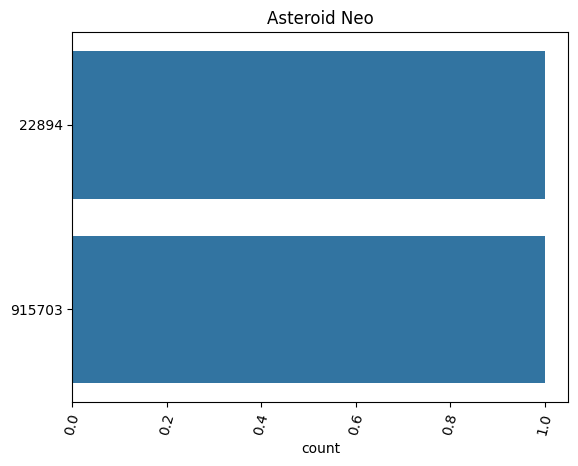

In [24]:
x=df1.neo.value_counts()
sns.countplot(y=x)
plt.xticks(rotation=75);
plt.title("Asteroid Neo")
plt.ylabel(None);

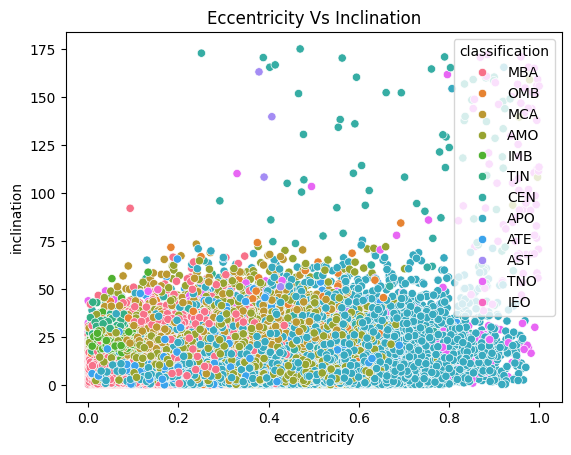

In [25]:
ax = sns.scatterplot(x='eccentricity',y='inclination',
                     hue='classification',data=df1)
ax.set_title('Eccentricity Vs Inclination')
plt.show()

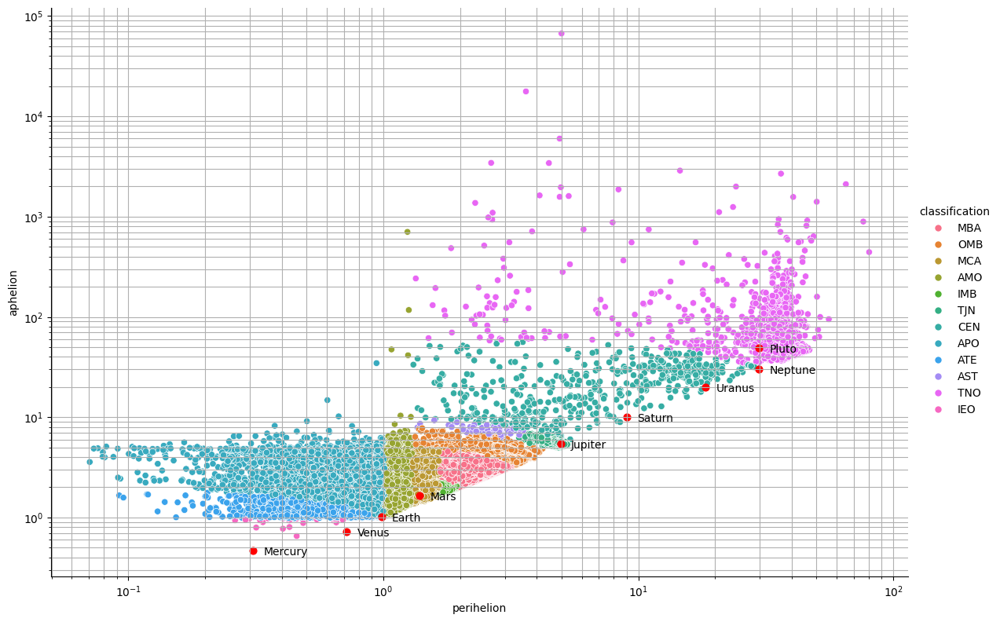

In [26]:
ellipticals = df1[ df1['classification'] != "HYA"][[
    'semi_major_axis','eccentricity','classification']]
to_perihelion = lambda semi_major_axis,eccentricity :semi_major_axis * (1 - eccentricity)
to_aphelion = lambda semi_major_axis,eccentricity : semi_major_axis * (1 + eccentricity)
ellipticals[
    'perihelion'] = to_perihelion( ellipticals.semi_major_axis,
                                  ellipticals.eccentricity )
ellipticals[
    'aphelion'] = to_aphelion( ellipticals.semi_major_axis,
                              ellipticals.eccentricity )

Orbit = namedtuple("Orbit",
                   "eccentricity semi_major_axis inclination")
planets = {
    "Mercury": Orbit(0.206,  0.3871,  7.00),
    "Venus":   Orbit(0.007,  0.7233,  3.39),
    "Earth":   Orbit(0.017,  1.0000,  0.00),
    "Mars":    Orbit(0.093,  1.5273,  1.85),
    "Jupiter": Orbit(0.048,  5.2028,  1.31),
    "Saturn":  Orbit(0.056,  9.5388,  2.49),
    "Uranus":  Orbit(0.046, 19.1914,  0.77),
    "Neptune": Orbit(0.010, 30.0611,  1.77),
    "Pluto" :  Orbit(0.248, 39.5294, 17.15)
    }
def plot_planets(names=planets.keys(), params=(
        1,1,200)):
    ax = plt.gca()
    scale_x, scale_y, size = params
    for name in names:
        orbit = planets[
            name]
        perihelion = to_perihelion(orbit.semi_major_axis,
                                   orbit.eccentricity)
        aphelion = to_aphelion(orbit.semi_major_axis,
                               orbit.eccentricity)
        plt.scatter( perihelion, aphelion,
                    c='red', s=size)
        plt.text( scale_x*perihelion, scale_y*aphelion,
                 name)

sns.relplot(data=ellipticals, x='perihelion',y='aphelion',
             hue='classification', height=8, aspect=12/8)
plot_planets(params=(1.1,0.9,40))

plt.minorticks_on()
plt.grid(which='both')
plt.xscale('log')
plt.yscale('log')

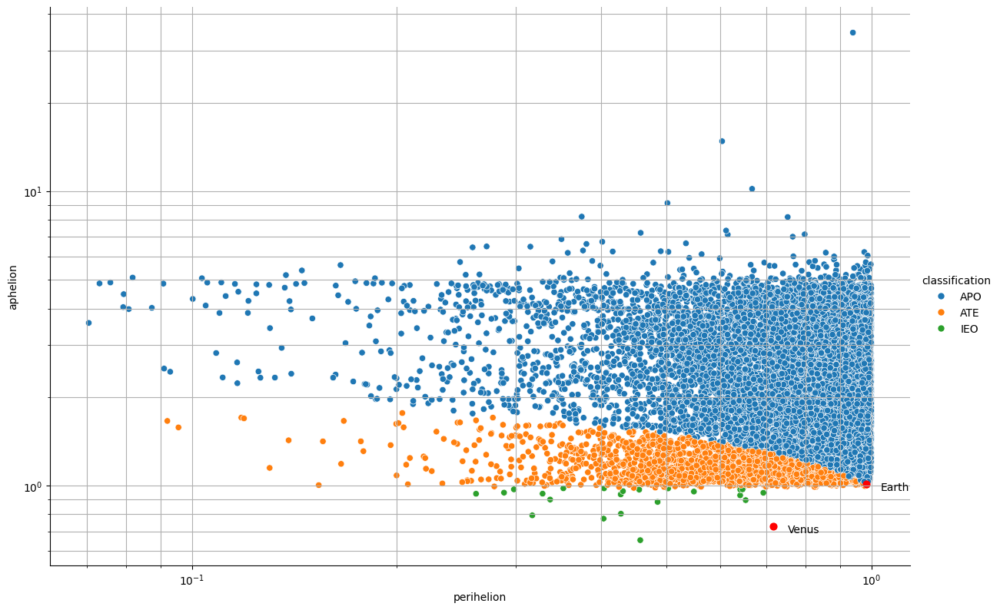

In [27]:
inner=ellipticals[ellipticals.perihelion < 1]
sns.relplot( data=inner, x='perihelion',
            y='aphelion', hue='classification',
            height=8, aspect=12/8)
plot_planets( ['Venus',
               'Earth'], params=(1.05, 0.95, 40))
plt.minorticks_on()
plt.grid(which='both')
plt.xscale('log')
plt.yscale('log')

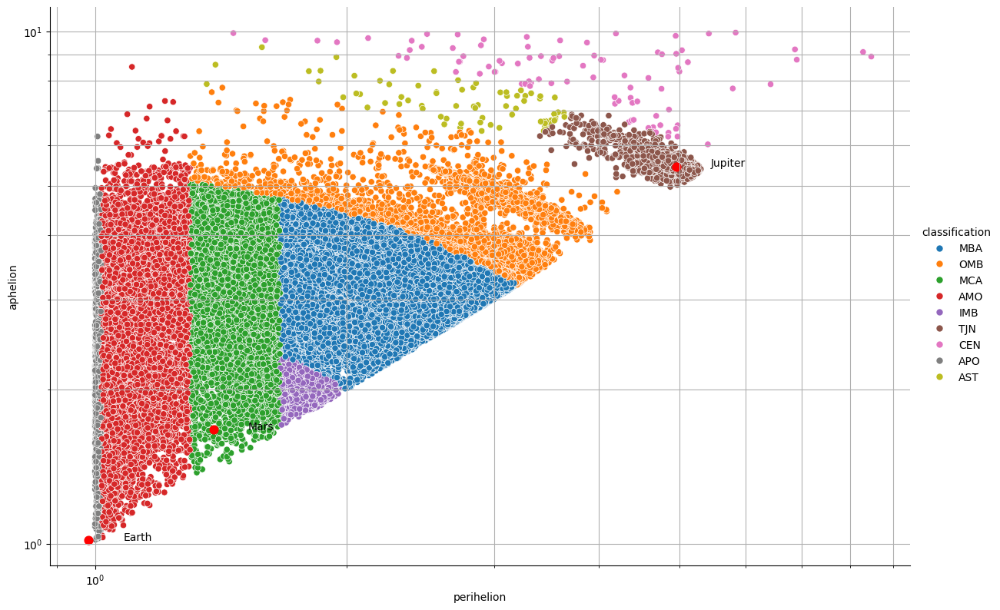

In [28]:
mid = ellipticals[
    (ellipticals.perihelion > 1) &
    (ellipticals.perihelion < 10) &
    (ellipticals.aphelion < 10)
    ]
sns.relplot(data=mid, x='perihelion',y='aphelion',
            hue='classification', height=8, aspect=12/8)
plot_planets( ['Earth','Mars',
               'Jupiter'], params=(1.1, 1, 60))
plt.minorticks_on()
plt.grid(which='both')
plt.xscale('log')
plt.yscale('log')

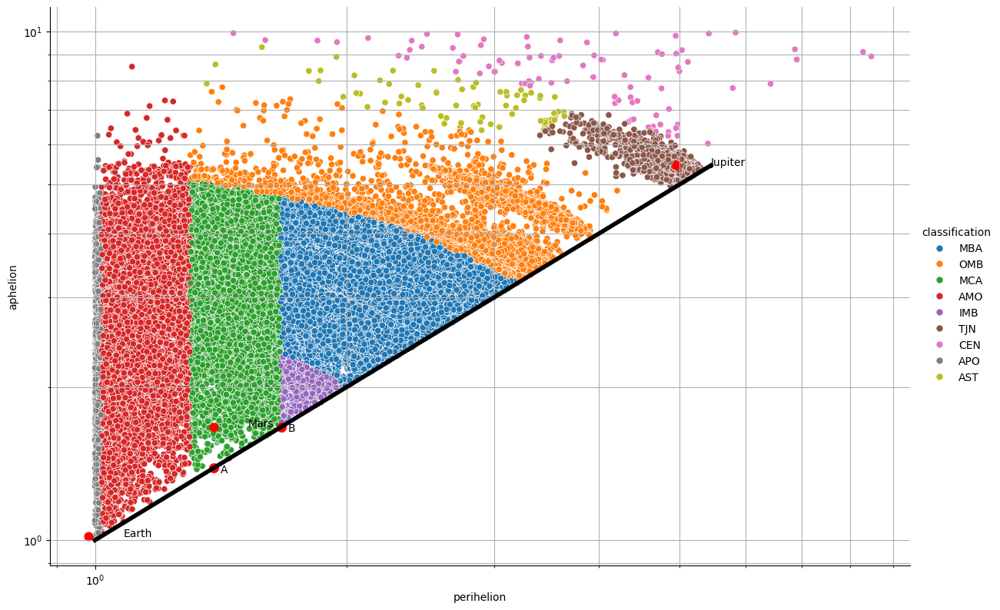

In [29]:
def add_point( x, y, text, size=70):
    plt.scatter( x, y, c='red', s=size)
    plt.text( 1.02*x, 0.98*y, text)

sns.relplot(data=mid, x='perihelion',y='aphelion',
            hue='classification', height=8, aspect=12/8)
plot_planets( ['Earth','Mars',
               'Jupiter'], params=(1.1, 1, 60))

X = [1, to_aphelion(planets[
    'Jupiter'].semi_major_axis, planets['Jupiter'].eccentricity)]
plt.plot( X, X, color='black', lw=4)

mars_perihelion = to_perihelion(planets[
    'Mars'].semi_major_axis, planets['Mars'].eccentricity)
mars_aphelion = to_aphelion( planets[
    'Mars'].semi_major_axis, planets['Mars'].eccentricity)
add_point( mars_perihelion, mars_perihelion, 'A')
add_point( mars_aphelion, mars_aphelion, 'B')

plt.minorticks_on()
plt.grid(which='both')
plt.xscale('log')
plt.yscale('log')

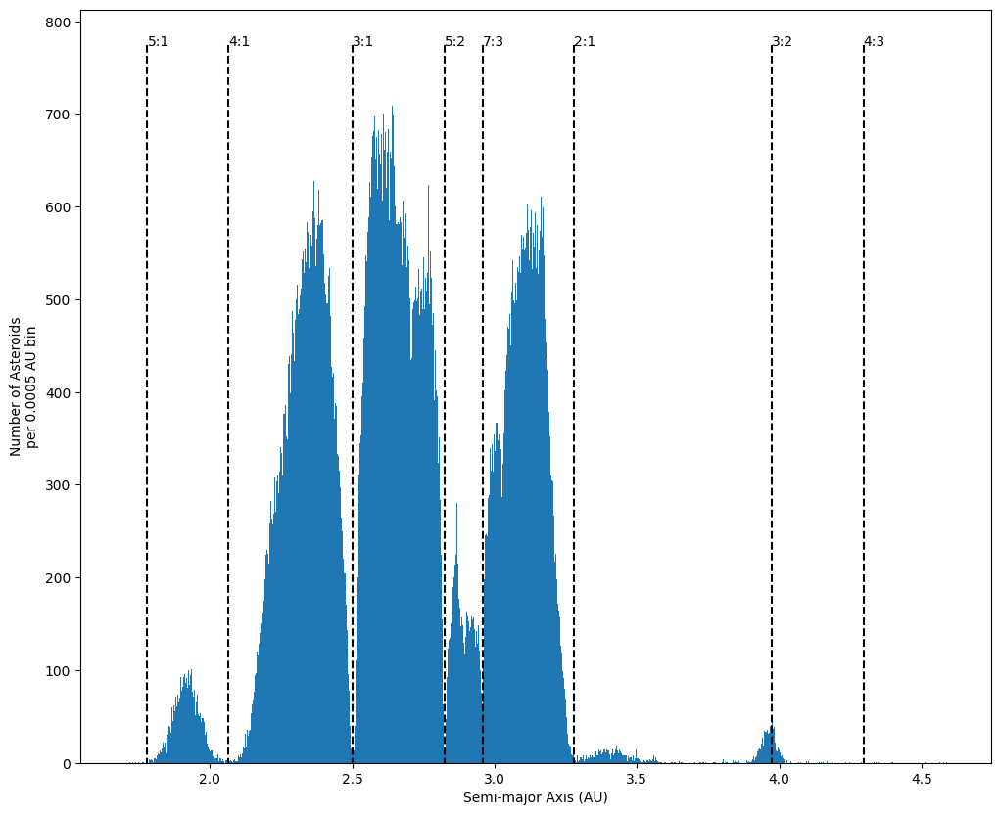

In [30]:
asteroid_belt = df1[ df1['classification'].isin([
    'IMB','MBA','OMB'])]
fig, ax = plt.subplots( figsize=(12,10),
                       facecolor='white')

bin_width = 0.0005
min_a = asteroid_belt.semi_major_axis.min()
max_a = asteroid_belt.semi_major_axis.max()
bins = np.arange( min_a, max_a, bin_width)
y, x, _ = plt.hist( asteroid_belt.semi_major_axis, bins=bins)
plt.xlabel('Semi-major Axis (AU)')
plt.ylabel(f'Number of Asteroids\nper {bin_width} AU bin')
peak_bin_height = y.max();


Kirkwood_Gap = namedtuple( "Kirkwood_Gap", "a desc")
gaps = [
    Kirkwood_Gap( 1.780, "5:1"),
    Kirkwood_Gap( 2.065, "4:1"),
    Kirkwood_Gap( 2.502, "3:1"),
    Kirkwood_Gap( 2.825, "5:2"),
    Kirkwood_Gap( 2.958, "7:3"),
    Kirkwood_Gap( 3.279, "2:1"),
    Kirkwood_Gap( 3.972, "3:2"),
    Kirkwood_Gap( 4.296, "4:3")
    ]
for gap in gaps:
    plt.plot( [gap.a, gap.a], [peak_bin_height, 0], 'k--')
    plt.text( gap.a, peak_bin_height, gap.desc)

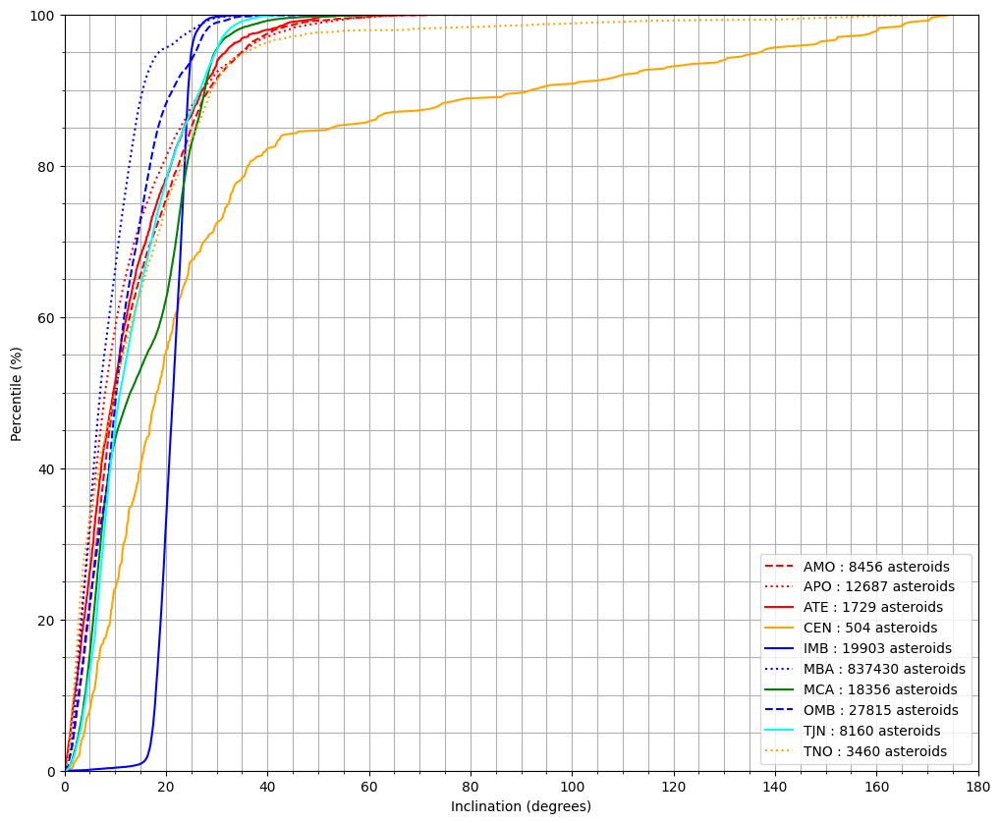

In [31]:
line_attr = namedtuple('line_attr', 'color style' )
styles = {
    'ATE': line_attr('red','solid'),
    'APO': line_attr('red','dotted'),
    'AMO': line_attr('red','dashed'),
    'MCA': line_attr('green','solid'),
    'IMB': line_attr('blue', 'solid'),
    'MBA': line_attr('blue', 'dotted'),
    'OMB': line_attr('blue', 'dashed'),
    'TJN': line_attr('cyan', 'solid'),
    'CEN': line_attr('orange','solid'),
    'TNO': line_attr('orange','dotted')
    }
def to_cdf( df, col):
    MAX_STEPS = 40000
    cdf = df.sort_values(by=col).reset_index(drop=True)
    cdf['percentile'] = 100*(cdf.index+1)/len(cdf)
    skip = 1 if len(cdf) < MAX_STEPS else len(cdf)//MAX_STEPS
    return cdf[::skip]
fig, ax = plt.subplots( figsize=(12,10))
for kls, group in df1.groupby('classification'):
    if kls not in styles:
        continue
    label = f"{kls} : {len(group)} asteroids"
    c = styles[kls].color
    ls = styles[kls].style
    to_cdf( group, 'inclination').plot(ax=ax,
                                       x='inclination', y='percentile',
                                       c=c, ls=ls, label=label)

plt.minorticks_on()
plt.grid(which='both')
plt.xlabel('Inclination (degrees)')
plt.ylabel('Percentile (%)')
plt.xlim(0,180)
plt.ylim(0,100);

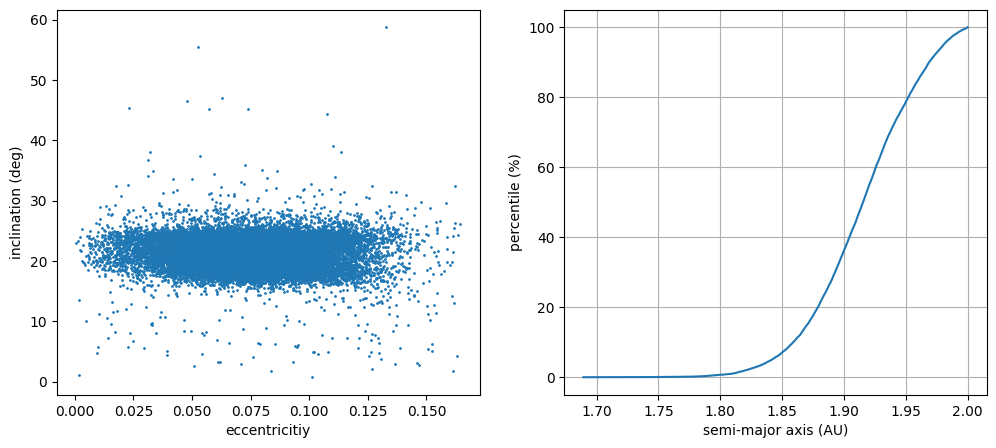

In [32]:
fig, axes = plt.subplots(1,2,
                         figsize=(12,5),
                         facecolor='white')
imb = df1[ df1['classification'] == 'IMB']
imb.plot( ax=axes[0], kind='scatter', s=1,
          x='eccentricity', y='inclination')
axes[0].set_xlabel('eccentricitiy')
axes[0].set_ylabel('inclination (deg)')

to_cdf( imb, 'semi_major_axis').plot(ax=axes[1],
                                     x='semi_major_axis', y='percentile',
                                     legend=None)
axes[1].set_xlabel('semi-major axis (AU)')
axes[1].set_ylabel('percentile (%)')
axes[1].grid(which='both')

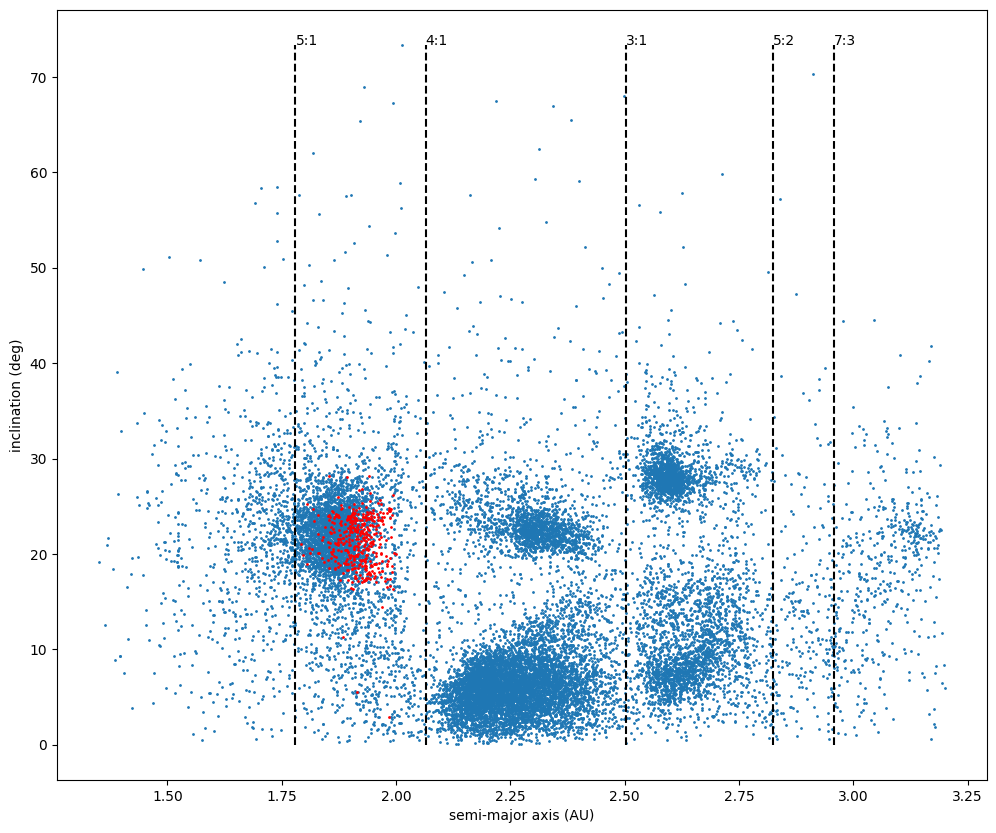

In [33]:
mca = df1[ df1['classification'] == 'MCA']

fig, ax = plt.subplots( figsize=(12,10))
mca.plot(ax=ax, kind='scatter', s=1,
         x='semi_major_axis', y='inclination' )
imb.sample(frac=0.02).plot(ax=ax, kind='scatter', s=1,
                           x='semi_major_axis', y='inclination',
                           c='r' )

max_a = mca.semi_major_axis.max()
min_a = mca.semi_major_axis.min()
i_max = mca.inclination.max()
for gap in gaps:
    if min_a <= gap.a <= max_a:
        plt.plot( [gap.a, gap.a], [0,i_max], "k--")
        plt.text(gap.a, i_max, gap.desc)

ax.set_xlabel('semi-major axis (AU)')
ax.set_ylabel('inclination (deg)');

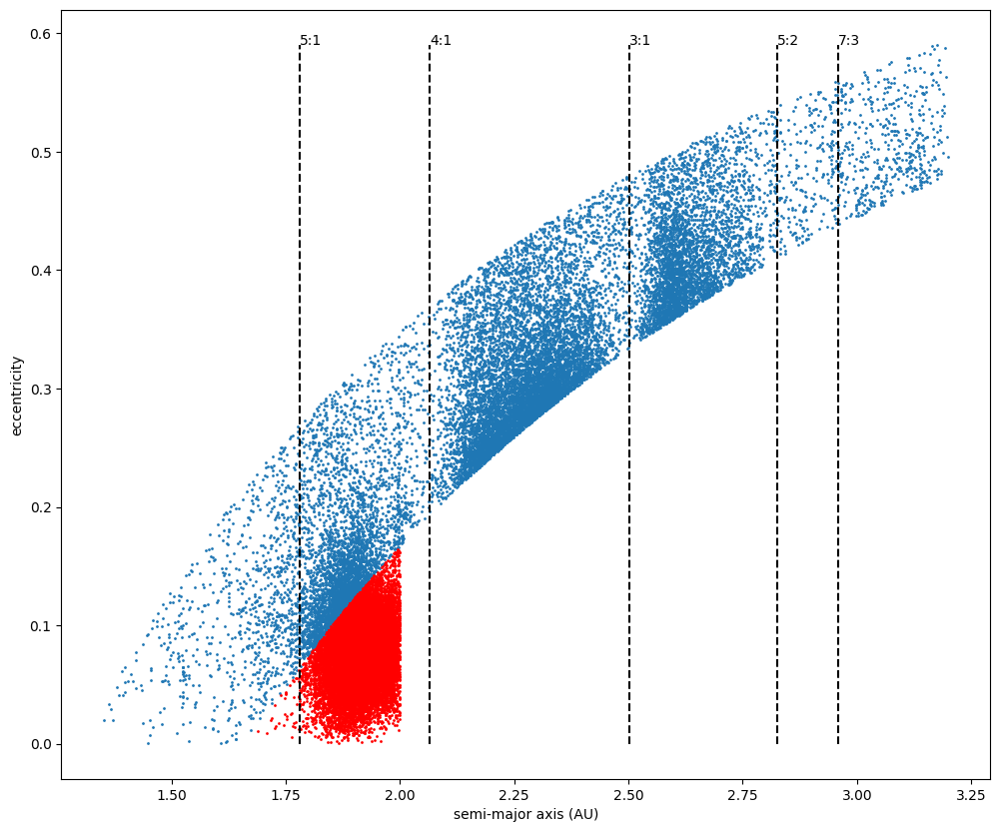

In [34]:
fig, ax = plt.subplots( figsize=(12,10))
mca.plot(ax=ax, kind='scatter', s=1,
         x='semi_major_axis', y='eccentricity' )
imb.plot(ax=ax, kind='scatter', s=1,
         x='semi_major_axis', y='eccentricity', c='r')
max_a = mca.semi_major_axis.max()
min_a = mca.semi_major_axis.min()
e_max = mca.eccentricity.max()
for gap in gaps:
    if min_a <= gap.a <= max_a:
        plt.plot( [gap.a, gap.a], [0,e_max], "k--")
        plt.text(gap.a, e_max, gap.desc)

ax.set_xlabel('semi-major axis (AU)')
ax.set_ylabel('eccentricity');

# **EXPLORATORY DATA ANALYSIS OF DATASET 2**

Text(0.5, 1.0, 'Relative Velocity')

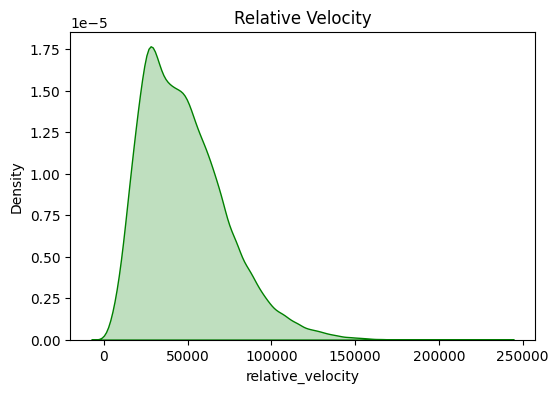

In [35]:
plt.figure(figsize = (6,4))
sns.kdeplot(df2.relative_velocity,
            shade=True, color = 'g')
plt.title('Relative Velocity')

Text(0.5, 1.0, 'Brightness')

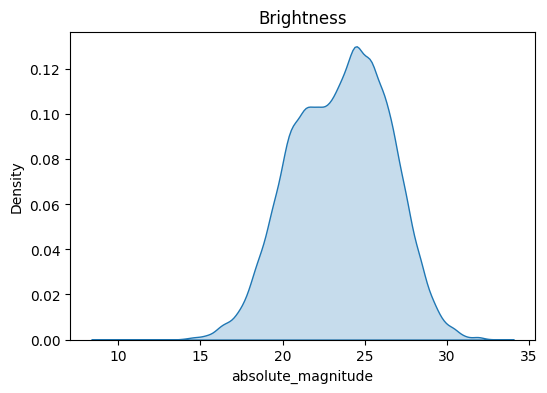

In [36]:
plt.figure(figsize = (6,4))
sns.kdeplot(df2.absolute_magnitude,
            shade=True)
plt.title('Brightness')

Text(0.5, 1.0, 'Miss Distance')

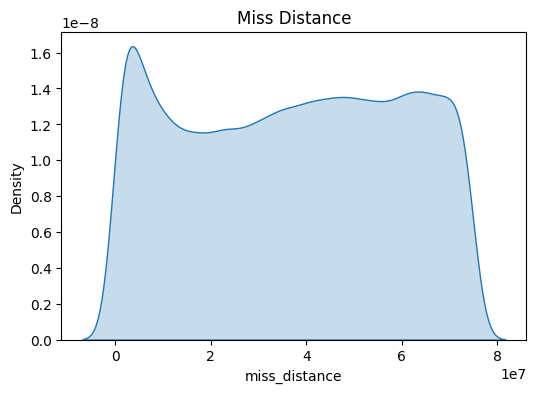

In [37]:
plt.figure(figsize = (6,4))
sns.kdeplot(df2.miss_distance,
            shade=True)
plt.title('Miss Distance')

<Axes: xlabel='hazardous', ylabel='count'>

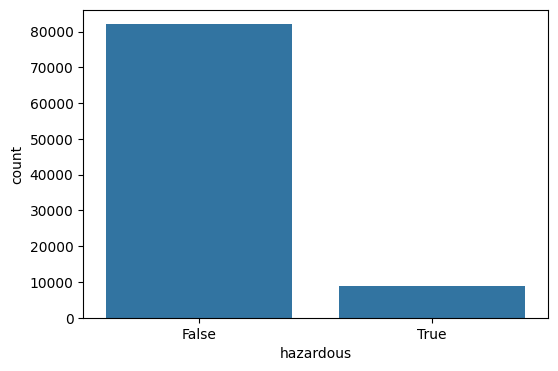

In [38]:
plt.figure(figsize = (6,4))
sns.countplot(x='hazardous',
              data = df2)

<Axes: xlabel='absolute_magnitude', ylabel='relative_velocity'>

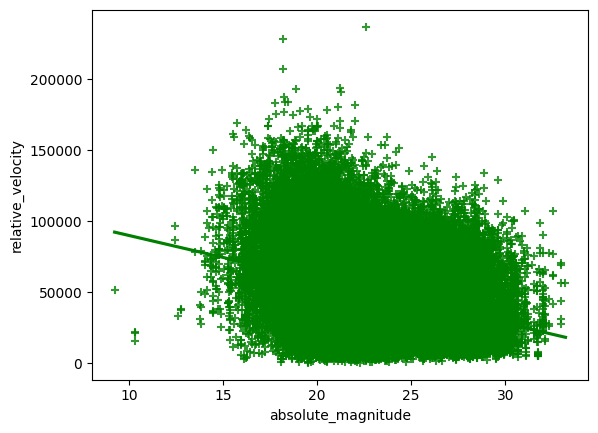

In [39]:
sns.regplot(data = df2, x='absolute_magnitude', y='relative_velocity',
            color = 'g', marker = '+')

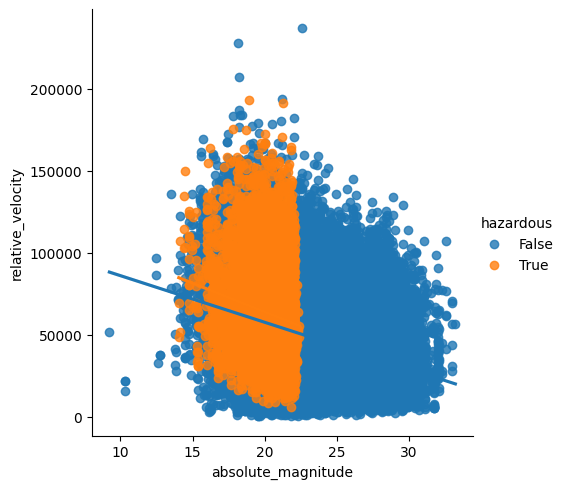

In [40]:
sns.lmplot(data = df2, x='absolute_magnitude',
            y='relative_velocity', hue = 'hazardous')

# **Label Encoding and Null value Imputation**

In [41]:
# Select categorical columns
categorical_columns = new_df.select_dtypes(include=[
    'object']).columns

# Print the categorical column names
print("Categorical Columns:")
for col in categorical_columns:
    print(col)

Categorical Columns:
full_name
neo
pha
orbit_id
classification


In [42]:
categorical_cols = new_df.select_dtypes(include=[
    'object']).columns
numerical_cols = new_df.select_dtypes(include=[
    'number']).columns

imputer_categorical = SimpleImputer(strategy='most_frequent')
new_df[categorical_cols] = imputer_categorical.fit_transform(
    new_df[categorical_cols])

imputer_numerical = SimpleImputer(strategy='mean')
new_df[numerical_cols] = imputer_numerical.fit_transform(
    new_df[numerical_cols])

print(new_df)

               id                 full_name neo pha       H   diameter  \
0       2000433.0        433 Eros (1898 DQ)   Y   N  10.400  16.840000   
1       2000433.0        433 Eros (1898 DQ)   Y   N  10.400  16.840000   
2       2000433.0        433 Eros (1898 DQ)   Y   N  10.400  16.840000   
3       2000719.0      719 Albert (1911 MT)   Y   N  15.400   5.506429   
4       2001036.0    1036 Ganymed (1924 TD)   Y   N   9.400  37.675000   
...           ...                       ...  ..  ..     ...        ...   
72482  54017232.0                (2020 KQ4)   Y   N  26.419   5.506429   
72483  54017232.0                (2020 KQ4)   Y   N  26.419   5.506429   
72484  54017232.0                (2020 KQ4)   Y   N  26.419   5.506429   
72485  54017232.0                (2020 KQ4)   Y   N  26.419   5.506429   
72486   3013075.0                (6344 P-L)   Y   Y  20.400   5.506429   

         albedo  diameter_sigma orbit_id      epoch  epoch_mjd   epoch_cal  \
0      0.250000        0.060000  

# **Exploratory Data Analysis of merged dataset**

In [43]:
print(new_df.columns)

Index(['id', 'full_name', 'neo', 'pha', 'H', 'diameter', 'albedo',
       'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal',
       'eccentricity', 'semi_major_axis', 'perihelion_distance', 'inclination',
       'om', 'w', 'ma', 'ad', 'mean_motion', 'time_of_perihelion_passage',
       'tp_cal', 'period_days', 'period_years', 'moid', 'moid_ld', 'sigma_e',
       'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'sigma_ma',
       'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'classification', 'rms',
       'est_diameter_min', 'est_diameter_max', 'relative_velocity',
       'miss_distance', 'absolute_magnitude', 'hazardous'],
      dtype='object')


In [44]:
new_df.info()
new_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72487 entries, 0 to 72486
Data columns (total 46 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          72487 non-null  float64
 1   full_name                   72487 non-null  object 
 2   neo                         72487 non-null  object 
 3   pha                         72487 non-null  object 
 4   H                           72487 non-null  float64
 5   diameter                    72487 non-null  float64
 6   albedo                      72487 non-null  float64
 7   diameter_sigma              72487 non-null  float64
 8   orbit_id                    72487 non-null  object 
 9   epoch                       72487 non-null  float64
 10  epoch_mjd                   72487 non-null  float64
 11  epoch_cal                   72487 non-null  float64
 12  eccentricity                72487 non-null  float64
 13  semi_major_axis             724

(72487, 46)

In [45]:
new_df.describe()

,id,H,diameter,albedo,diameter_sigma,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude
count,7.248700e+04,72487.000000,72487.000000,72487.000000,72487.000000,7.248700e+04,72487.000000,7.248700e+04,72487.000000,72487.000000,72487.000000,72487.000000,72487.000000,72487.000000,72487.000000,72487.000000,72487.000000,7.248700e+04,7.248700e+04,7.248700e+04,72487.000000,72487.000000,72487.000000,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,7.248700e+04,72487.000000,72487.000000,72487.000000,72487.000000,7.248700e+04,72487.000000
mean,4.882574e+06,23.195143,5.293108,0.133326,0.462723,2.458670e+06,58669.802254,2.019139e+07,0.373465,1.391731,0.817501,12.424868,173.322085,183.925543,176.828458,1.965961,0.742828,2.458666e+06,2.019057e+07,6.608714e+02,1.809367,0.071521,27.833855,9.444987e-04,5.036634e-03,5.040282e-04,3.495651e-02,3.860461e-02,8.803583e-02,3.631075e-01,8.727972e-03,9.963295e-04,5.276036e-01,1.591239e+01,0.778679,0.145144,0.324552,48710.654683,3.749790e+07,23.204824
std,8.436093e+06,2.906512,1.011809,0.032274,0.085811,1.033293e+03,1033.293398,2.853800e+04,0.180046,1.420184,0.236194,10.485760,103.919601,103.944614,110.506241,2.808935,0.339901,1.051536e+03,2.891380e+04,9.011623e+03,24.672480,0.083878,32.642883,1.507686e-02,3.524876e-01,1.140844e-02,9.372643e-01,1.119543e+00,2.123332e+00,7.232556e+00,6.932576e-01,1.459528e-02,1.215759e+01,3.243236e+03,28.217786,0.328745,0.735097,25652.886680,2.218169e+07,2.898364
min,2.000433e+06,9.400000,0.002500,0.009000,0.000500,2.450972e+06,50971.000000,1.998061e+07,0.002846,0.555418,0.070511,0.013518,0.025992,0.007924,0.005210,0.653773,0.000149,2.451026e+06,1.998073e+07,1.511918e+02,0.413941,0.000003,0.001331,1.285600e-10,4.026100e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,2.103800e-07,4.846400e-11,2.860900e-11,3.088400e-07,2.335200e-08,0.037189,0.000609,0.001362,271.446828,1.185167e+04,9.230000
25%,3.367758e+06,21.000000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.233978,1.004212,0.645856,4.639126,81.587585,94.006924,75.852404,1.260147,0.474099,2.458807e+06,2.019112e+07,3.675670e+02,1.006344,0.010900,4.241836,2.901400e-07,2.745700e-08,3.188700e-07,2.532000e-05,3.336200e-05,7.896450e-05,9.417300e-05,3.864600e-08,2.037600e-08,1.217600e-04,1.820600e-05,0.399270,0.022108,0.049436,28993.783002,1.799617e+07,21.000000
50%,3.683393e+06,23.300000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.355376,1.236034,0.844497,9.243184,175.038417,189.586809,173.707989,1.599606,0.717230,2.458956e+06,2.020042e+07,5.019311e+02,1.374212,0.036803,14.322585,5.075700e-05,4.243000e-05,1.140100e-05,8.334200e-04,2.671900e-04,9.629100e-04,2.366700e-02,5.486500e-05,4.032300e-05,1.554000e-02,2.486600e-02,0.473670,0.058151,0.130029,44853.969726,3.837795e+07,23.300000
75%,3.789390e+06,25.400000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.499362,1.628883,0.998032,17.848785,255.407651,274.104763,278.053235,2.371613,0.979413,2.459093e+06,2.020083e+07,7.593347e+02,2.078945,0.104185,40.545676,3.807900e-04,4.738400e-04,1.412300e-04,9.763500e-03,2.125700e-03,8.972800e-03,2.206500e-01,6.322800e-04,3.755500e-04,2.281700e-01,2.995750e-01,0.553930,0.167708,0.375008,63726.663348,5.678039e+07,25.400000
max,5.401723e+07,33.200000,37.675000,0.658000,2.155000,2.459000e+06,59000.000000,2.020053e+07,0.996476,352.628376,1.507932,165.541000,359.977940,359.982032,359.998040,704.014132,2.381082,2.460373e+06,2.024030e+07,2.418657e+06,6621.922401,0.506547,197.132896,2.145200e+00,8.466800e+01,1.504400e+00,7.540400e+01,1.654500e+02,2.152500e+02,7.966400e+02,1.690400e+02,2.38

In [46]:
new_df.isnull().sum()

id                            0
full_name                     0
neo                           0
pha                           0
H                             0
diameter                      0
albedo                        0
diameter_sigma                0
orbit_id                      0
epoch                         0
epoch_mjd                     0
epoch_cal                     0
eccentricity                  0
semi_major_axis               0
perihelion_distance           0
inclination                   0
om                            0
w                             0
ma                            0
ad                            0
mean_motion                   0
time_of_perihelion_passage    0
tp_cal                        0
period_days                   0
period_years                  0
moid                          0
moid_ld                       0
sigma_e                       0
sigma_a                       0
sigma_q                       0
sigma_i                       0
sigma_om

In the above code segment, we are checking for the existence of null values from the newly created merged dataframe. The output indicates that there are no null values present in new_df.

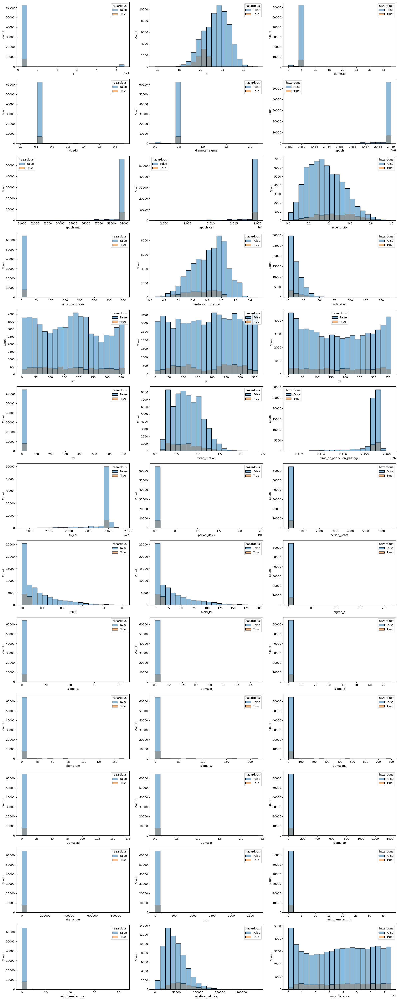

In [47]:
fig, axes = plt.subplots(13, 3, figsize=(20, 50))
for i, ax in enumerate(axes.flatten()):
    if i < len(numerical_cols):
        sns.histplot(
            data=new_df,
            x=new_df[numerical_cols[i]],
            hue="hazardous",
            ax=ax,
            bins=20,
        )
    else:
        fig.delaxes(ax)
plt.tight_layout()
plt.show()

 The above code is creating a grid of histograms, each representing the distribution of a numerical variable from the DataFrame new_df. The histograms are colored based on the "hazardous" column, and subplots corresponding to indices beyond the length of numerical_cols are removed.

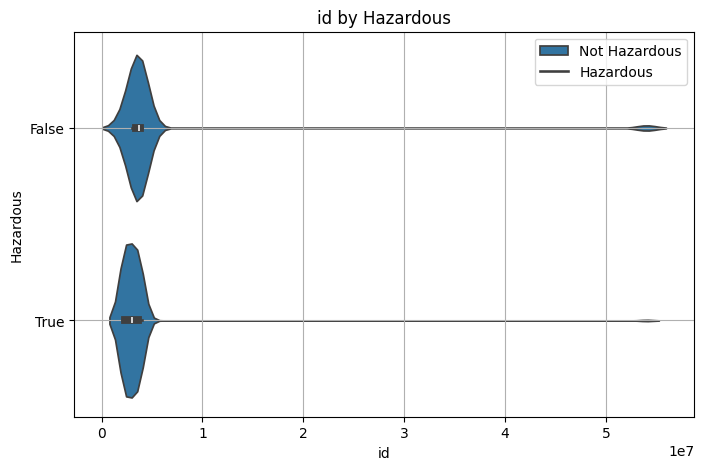

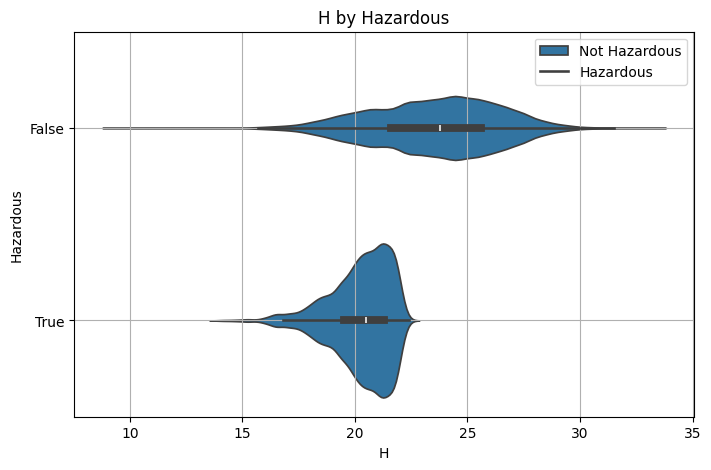

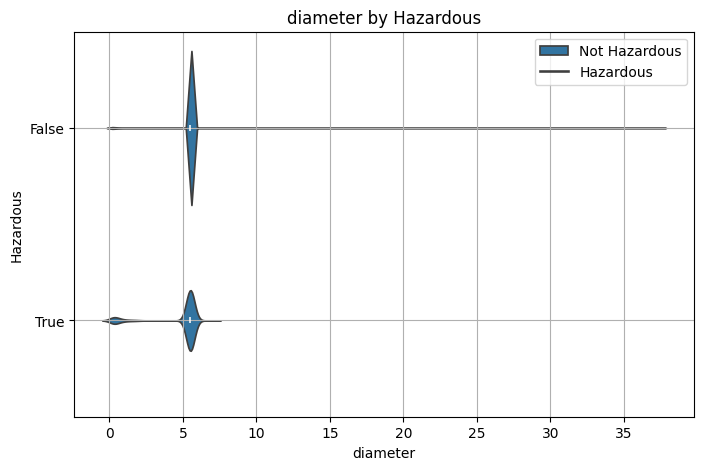

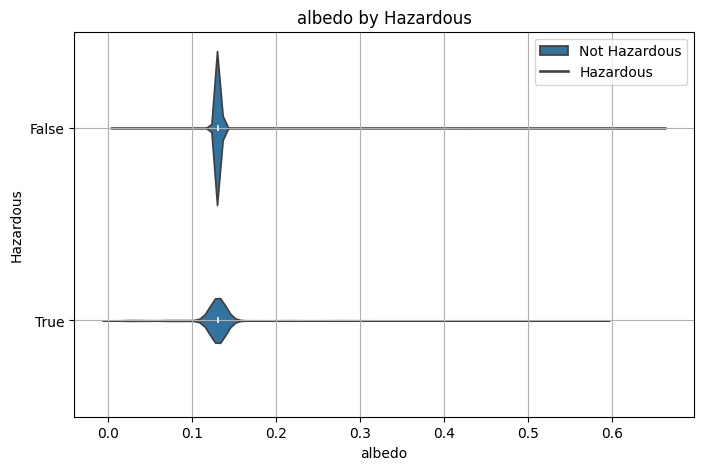

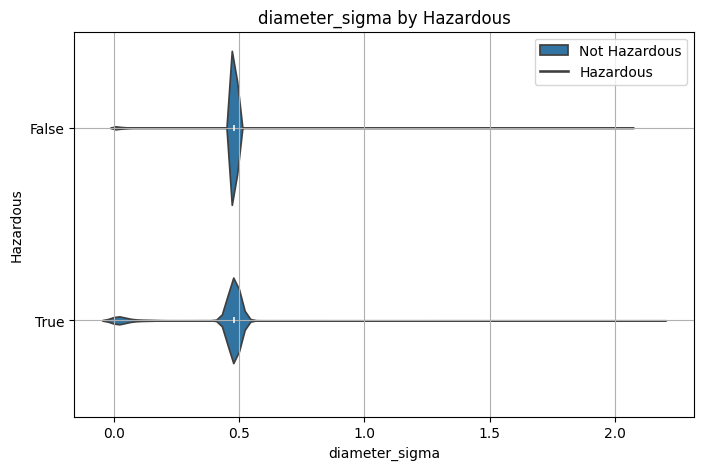

...

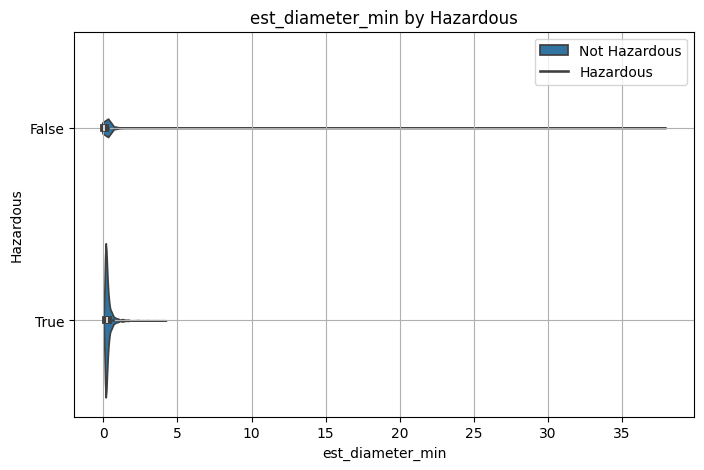

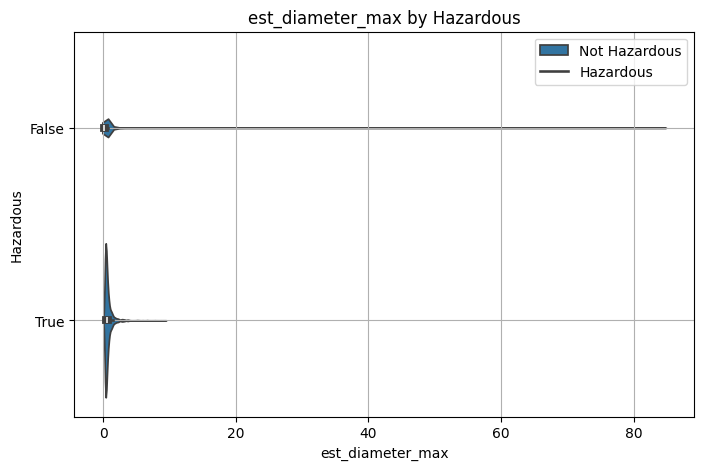

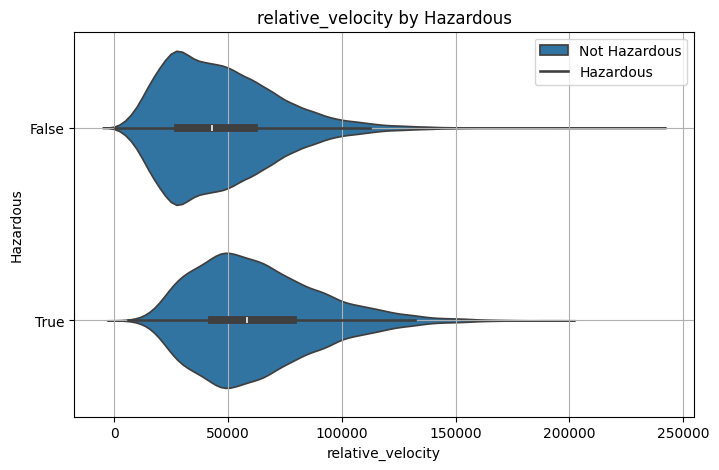

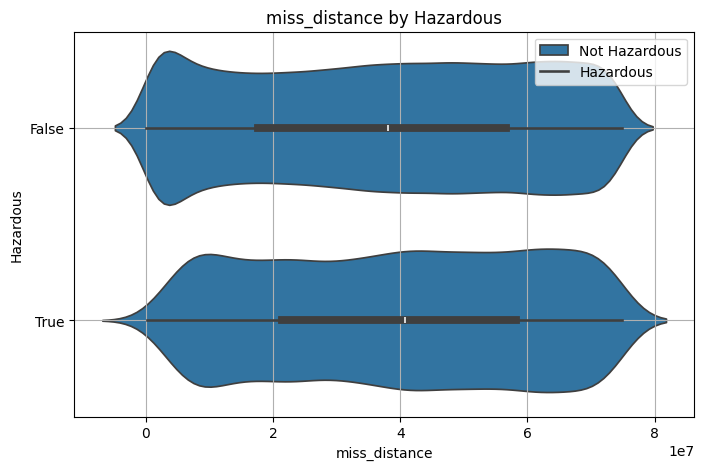

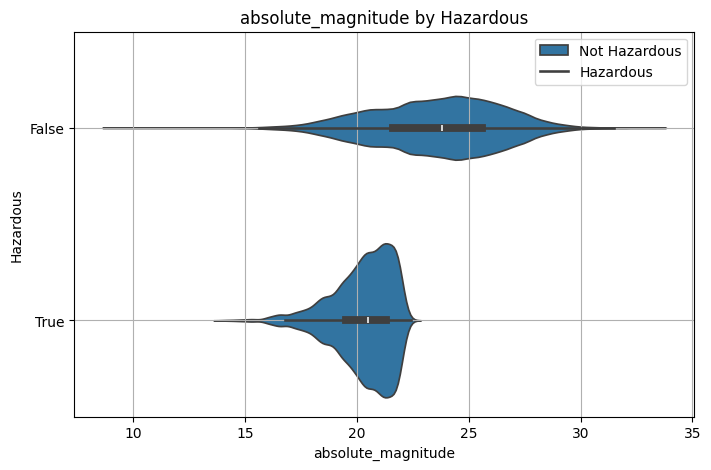

In [48]:
for k in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.violinplot(data=new_df, x=k,
                   y='hazardous', orient='h')
    plt.title(f'{k} by Hazardous')
    plt.xlabel(k)
    plt.ylabel('Hazardous')
    plt.grid()
    plt.legend(['Not Hazardous',
                'Hazardous'])
    plt.show()

 The violin plots in the above given code help in visually comparing the distributions of numerical variables across the "Hazardous" and "Not Hazardous" categories, providing a clear understanding of how each numerical variable relates to the hazard classification in the dataset.

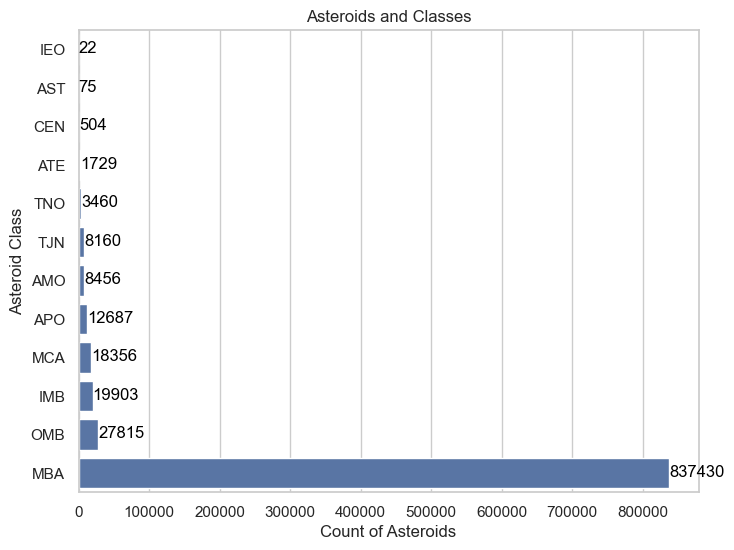

In [49]:
counts = counts.sort_values(by="pha", ascending=True)

sns.set(style="whitegrid")
f, ax = plt.subplots(figsize=(8, 6))
sns.barplot(y="classification", x="pha", data=counts)
ax.set(ylabel='Asteroid Class', xlabel='Count of Asteroids')
plt.title("Asteroids and Classes")

for i, v in enumerate(counts['pha']):
    ax.text(v + 10, i + 0.1, str(v), color='black')

plt.show()

In [50]:
class_counts = counts.groupby(['classification', 'pha']).size().reset_index(name='count')
print(class_counts)

   classification     pha  count
0             AMO    8456      1
1             APO   12687      1
2             AST      75      1
3             ATE    1729      1
4             CEN     504      1
5             IEO      22      1
6             IMB   19903      1
7             MBA  837430      1
8             MCA   18356      1
9             OMB   27815      1
10            TJN    8160      1
11            TNO    3460      1


The significant count of MBA asteroids indicates that a large portion of the observed asteroids in the dataset belongs to the Main Asteroid Belt, which is located between the orbits of Mars and Jupiter. This is a common region for asteroids, and it's expected to have a high number of observations from this area.
The plot also shows the distribution of other asteroid classes. Some classes, such as "OMB" (Outer Main Belt) and "IMB" (Inner Main Belt), have relatively lower counts compared to MBA.

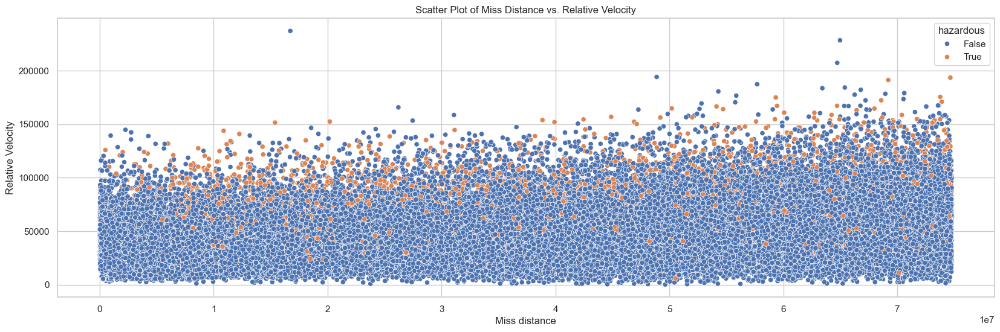

In [51]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='miss_distance',
                y='relative_velocity',
                data=new_df, hue='hazardous')
plt.title('Scatter Plot of Miss Distance vs. Relative Velocity')
plt.xlabel('Miss distance')
plt.ylabel('Relative Velocity')
plt.show()

In the above code, a scatter plot is created using Seaborn to visualize the relationship between two variables: 'miss_distance' on the x-axis and 'relative_velocity' on the y-axis.

The scatter plot visually represents how miss distance and relative velocity are distributed among asteroids.
Most asteroids tend to have relatively high miss distances, with a substantial portion falling within the upper range of the distribution.
The spread of relative velocities is also noticeable, indicating that asteroids approach Earth with diverse speeds.

It looks most asteroids above the range of 50000 m/s are mostly hazardous.

In [52]:
new_df.head(10)

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,15884.252623,5.468808e+07,10.31,False
1,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,21402.705247,2.672952e+07,10.31,False
2,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,21761.703426,3.120592e+07,10.31,False
3,2000719.0,719 Albert (1911 MT),Y,N,15.4,5.506429,0.130627,0.479184,JPL 214,2459000.5,59000.0,20200531.0,0.546558,2.638602,1.196452,11.567485,183.866950,156.176338,140.273422,4.080752,0.229955,2.458390e+06,2.018093e+07,1565.522356,4.286167,0.203482,79.189090,2.178400e-08,2.531300e-09,5.811600e-08,2.910800e-06,1.657500e-05,1.682700e-05,2.521300e-06,3.914800e-09,3.309000e-10,1.030600e-05,2.252800e-06,AMO,0.39148,2.044349,4.571303,27551.597194,4.258288e+07,15.57,False
4,2001036.0,1036 Ganymed (1924 TD),Y,N,9.4,37.675000,0.238000,0.399000,783,2459000.5,59000.0,20200531.0,0.533046,2.664725,1.244303,26.677643,215.546826,132.364631,4.817745,4.085146,0.226582,2.458979e+06,2.020051e+07,1588.828164,4.349974,0.344956,134.246527,2.430100e-08,2.418900e-09,6.479000e-08,4.053800e-06,7.192300e-06,7.608300e-06,2.395500e-06,3.708300e-09,3.085200e-10,1.055200e-05,2.163400e-06,AMO,0.38253,37.892650,84.730541,51496.923293,5.372124e+07,9.23,False
5,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.000000,0.510000,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.186500,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.327010,3.637100e-08,2.817900e-09,3.916900e-08,1.262200e-05,3.976000e-06,6.834700e-06,6.467900e-06,5.148400e-09,3.451500e-09,8.054200e-06,1.603100e-06,APO,0.33228,1.427431,3.191832,76768.627248,5.188275e+07,16.35,True
6,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.000000,0.510000,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.186500,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.327010,3.637100e-08,2.817900e-09,3.916900e-08,1.262200e-05,3.976000e-06,6.834700e-06,6.467900e-06,5.148400e-09,3.451500e-09,8.054200e-06,1.603100e-06,APO,0.33228,1.427431,3.191832,136986.629106,4.442794e+07,16.35,True
7,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.000000,0.510000,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.186500,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.327010,3.637100e-08,2.817900e

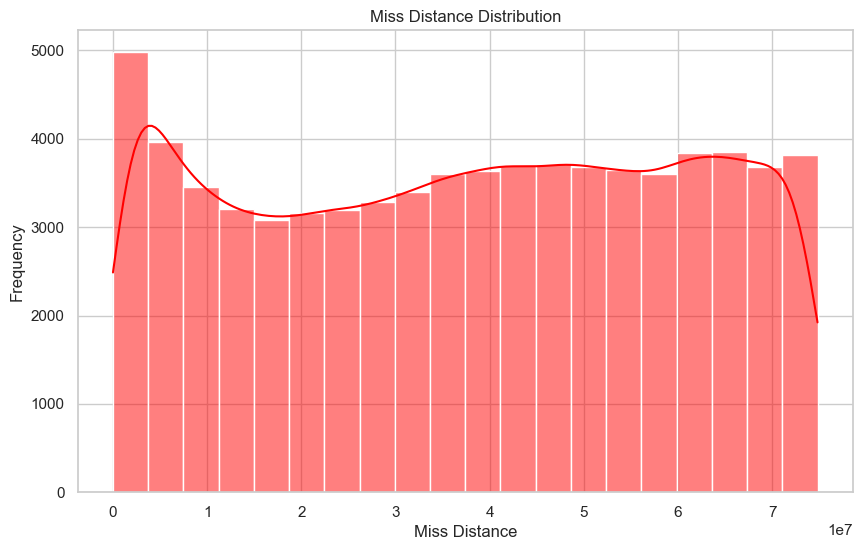

In [53]:
plt.figure(figsize=(10, 6))
sns.histplot(new_df['miss_distance'],
             bins=20, kde=True,
             color='red')
plt.title('Miss Distance Distribution')
plt.xlabel('Miss Distance')
plt.ylabel('Frequency')
plt.show()

The histogram depicts the distribution of miss distances for asteroids in the dataset.
The histogram shows that the distribution of miss distances is right-skewed, indicating that the majority of asteroids have relatively smaller miss distances,
but there are also a few instances with larger miss distances.
The KDE curve provides a continuous estimate of the distribution, emphasizing the overall pattern.

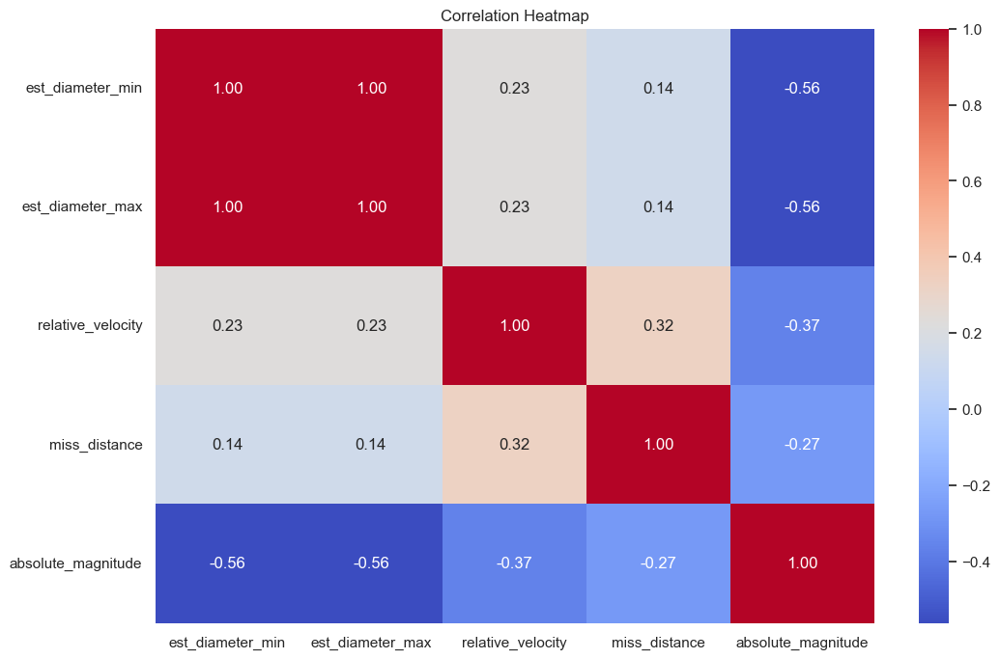

In [54]:
# Correlation Heatmap
correlation_matrix = new_df[['est_diameter_min',
                             'est_diameter_max', 'relative_velocity',
                             'miss_distance', 'absolute_magnitude' ]].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True,
            cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

1. est_diameter_min vs. est_diameter_max (1.0):
Perfect positive correlation, which is expected since these represent the minimum and maximum estimated diameters. They are essentially the same variable.

2. relative_velocity vs. miss_distance (0.225):
A positive correlation, indicating that as relative_velocity increases, miss_distance tends to increase as well. However, the correlation is not very strong.

3. est_diameter_min vs. relative_velocity (0.225):
A positive correlation, suggesting that there is a mild tendency for larger estimated diameters to be associated with higher relative velocities.

4. absolute_magnitude vs. est_diameter_min (-0.562):
A moderate negative correlation, implying that larger estimated diameters are associated with smaller absolute magnitudes. This makes sense, as smaller asteroids (with larger diameters) tend to be less reflective and, therefore, have smaller absolute magnitudes.

5. absolute_magnitude vs. miss_distance (-0.272):
A weak negative correlation, suggesting that, to some extent, smaller absolute magnitudes (larger, more reflective asteroids) may be associated with larger miss distances.

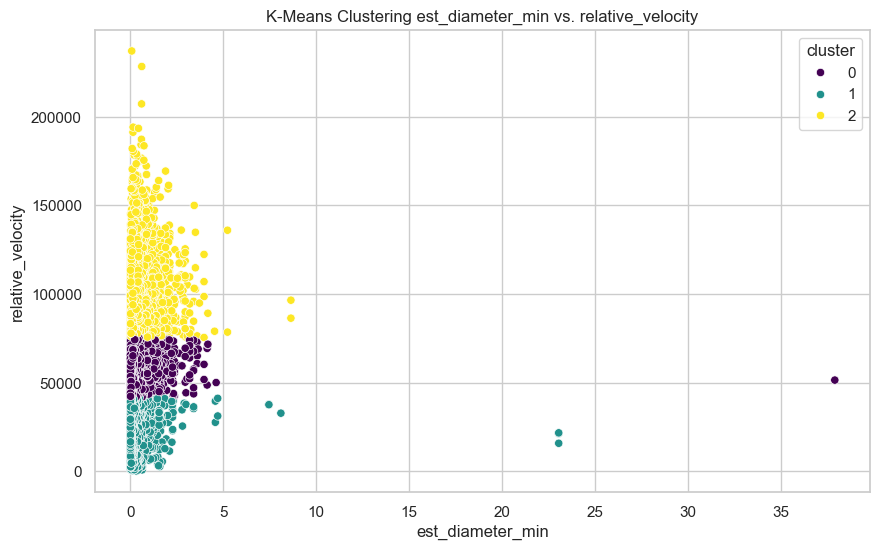

In [55]:
features_for_clustering = new_df[['est_diameter_min',
                                  'relative_velocity']]

kmeans = KMeans(n_clusters=3, random_state=42)
new_df['cluster'] = kmeans.fit_predict(features_for_clustering)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='est_diameter_min', y='relative_velocity',
                hue='cluster', data=new_df,
                palette='viridis')
plt.title('K-Means Clustering est_diameter_min vs. relative_velocity')
plt.show()

Asteroids in Cluster 0 tend to have larger diameters and higher velocities compared to other clusters.
Cluster 1 consists of objects with smaller diameters and moderate velocities.
Cluster 2 contains objects with the largest diameters and the highest velocities.

Cluster 2 has the largest objects (highest mean and median diameter) and the fastest velocities (highest mean and median velocity). This suggests a potential relationship between the size and speed of asteroids. Larger objects might exhibit higher velocities, which could have implications for their trajectories and potential impact risks.


# **Neo Analysis**

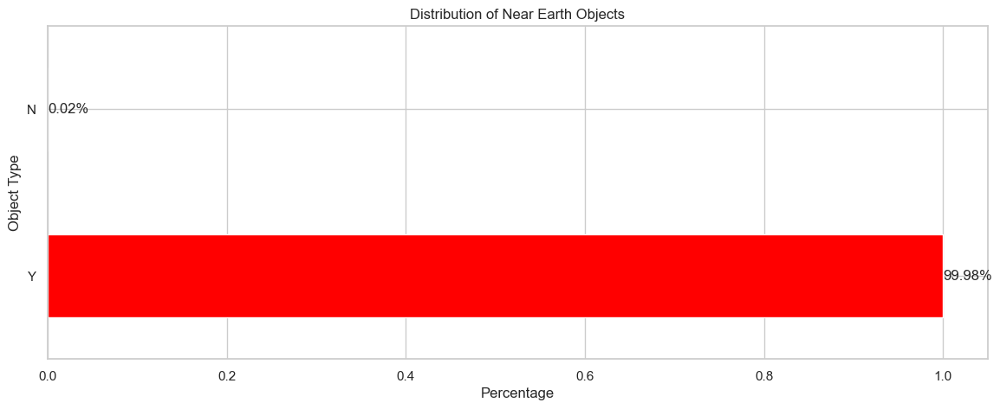

In [56]:
neocount = new_df['neo'].value_counts(normalize=True)
fig, ax = plt.subplots(figsize=(14, 5))
neocount.plot(kind='barh', color=['red',
                                  'blue'], ax=ax)

plt.title("Distribution of Near Earth Objects")
plt.xlabel("Percentage")
plt.ylabel("Object Type")
for index, value in enumerate(neocount):
    plt.text(value, index, f'{value:.2%}',
             ha='left', va='center')
plt.show()

In summary, the above code creates a horizontal bar chart to illustrate the distribution of Near Earth Objects in the DataFrame new_df. The chart includes percentage labels for each category.

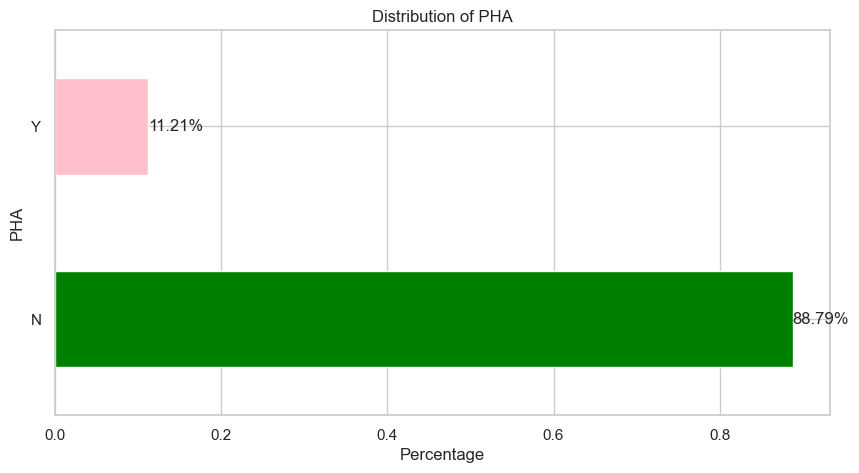

In [57]:
phacount = new_df['pha'].value_counts(normalize=True)
fig, ax = plt.subplots(figsize=(10, 5))
phacount.plot(kind='barh', color=['green',
                                  'pink'], ax=ax)

plt.title("Distribution of PHA")
plt.xlabel("Percentage")
plt.ylabel("PHA")
for index, value in enumerate(phacount):
    plt.text(value, index, f'{value:.2%}',
             ha='left', va='center')
plt.show()

the code creates a horizontal bar chart to illustrate the distribution of Potentially Hazardous Asteroids (PHA) in the DataFrame new_df. The chart includes percentage labels for each category.

In [58]:
def extract_neo(new_df):
    neo = new_df.loc[new_df.neo == 'Y',:]
    neo.to_csv('neo.csv')
    return neo

The above Python function, named extract_neo, takes a DataFrame (new_df) as input, extracts rows where the 'neo' column has the value 'Y' (indicating Near-Earth Objects), and then saves those rows to a CSV file named 'neo.csv'. Finally, the function returns the extracted DataFrame.

In [59]:
def extract_pha(new_df):
    pha = new_df.loc[new_df.pha == 'Y',:]
    pha.to_csv('pha.csv')
    return pha

def extract_neo_pha(new_df):
    neo_pha = new_df.loc[new_df.pha == 'Y' &
                         new_df.neo == 'Y',:]
    neo_pha.to_csv('neo_pha.csv')
    return neo_pha

def plot_scatter(new_df, params):
    for i in params:
        g = sns.FacetGrid(new_df, col = "classification",
                          hue = "pha")
        g.map(sns.scatterplot, "moid", i, alpha = .7)
        h = sns.FacetGrid(new_df, col = "classification",
                          hue = "pha")
        h.map(sns.scatterplot, "H", i,
              alpha = .7)
        g.add_legend()
        h.add_legend()
        plt.show()

neo = extract_neo(new_df)
neo.head()

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous,cluster
0,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,15884.252623,5.468808e+07,10.31,False,1
1,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,21402.705247,2.672952e+07,10.31,False,1
2,2000433.0,433 Eros (1898 DQ),Y,N,10.4,16.840000,0.250000,0.060000,656,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,AMO,0.27423,23.043847,51.527608,21761.703426,3.120592e+07,10.31,False,1
3,2000719.0,719 Albert (1911 MT),Y,N,15.4,5.506429,0.130627,0.479184,JPL 214,2459000.5,59000.0,20200531.0,0.546558,2.638602,1.196452,11.567485,183.866950,156.176338,140.273422,4.080752,0.229955,2.458390e+06,2.018093e+07,1565.522356,4.286167,0.203482,79.189090,2.178400e-08,2.531300e-09,5.811600e-08,2.910800e-06,1.657500e-05,1.682700e-05,2.521300e-06,3.914800e-09,3.309000e-10,1.030600e-05,2.252800e-06,AMO,0.39148,2.044349,4.571303,27551.597194,4.258288e+07,15.57,False,1
4,2001036.0,1036 Ganymed (1924 TD),Y,N,9.4,37.675000,0.238000,0.399000,783,2459000.5,59000.0,20200531.0,0.533046,2.664725,1.244303,26.677643,215.546826,132.364631,4.817745,4.085146,0.226582,2.458979e+06,2.020051e+07,1588.828164,4.349974,0.344956,134.246527,2.430100e-08,2.418900e-09,6.479000e-08,4.053800e-06,7.192300e-06,7.608300e-06,2.395500e-06,3.708300e-09,3.085200e-10,1.055200e-05,2.163400e-06,AMO,0.38253,37.892650,84.730541,51496.923293,5.372124e+07,9.23,False,0


The above code defines functions for extracting subsets of the DataFrame based on 'pha' and 'neo' values, as well as a function for plotting scatter plots. The extract_neo function is then called, and the extracted DataFrame (neo) is displayed.

In [60]:
pha = extract_pha(new_df)
pha.head()

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous,cluster
5,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.0,0.51,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.1865,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.32701,3.637100e-08,2.817900e-09,3.916900e-08,0.000013,0.000004,0.000007,0.000006,5.148400e-09,3.451500e-09,0.000008,0.000002,APO,0.33228,1.427431,3.191832,76768.627248,5.188275e+07,16.35,True,2
6,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.0,0.51,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.1865,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.32701,3.637100e-08,2.817900e-09,3.916900e-08,0.000013,0.000004,0.000007,0.000006,5.148400e-09,3.451500e-09,0.000008,0.000002,APO,0.33228,1.427431,3.191832,136986.629106,4.442794e+07,16.35,True,2
7,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.0,0.51,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.1865,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.32701,3.637100e-08,2.817900e-09,3.916900e-08,0.000013,0.000004,0.000007,0.000006,5.148400e-09,3.451500e-09,0.000008,0.000002,APO,0.33228,1.427431,3.191832,120524.290627,6.046638e+07,16.35,True,2
8,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.0,0.51,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.1865,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.32701,3.637100e-08,2.817900e-09,3.916900e-08,0.000013,0.000004,0.000007,0.000006,5.148400e-09,3.451500e-09,0.000008,0.000002,APO,0.33228,1.427431,3.191832,108801.296374,8.053782e+06,16.35,True,2
9,2001566.0,1566 Icarus (1949 MA),Y,Y,16.9,1.0,0.51,0.479184,107,2459000.5,59000.0,20200531.0,0.827021,1.078169,0.1865,22.822113,87.997544,31.393344,192.083181,1.969838,0.880387,2.459191e+06,2.020121e+07,408.910857,1.119537,0.034245,13.32701,3.637100e-08,2.817900e-09,3.916900e-08,0.000013,0.000004,0.000007,0.000006,5.148400e-09,3.451500e-09,0.000008,0.000002,APO,0.33228,1.427431,3.191832,78130.804282,6.564713e+07,16.35,True,2


In [61]:
print(neo.shape)
cols = list(neo.columns)
print(cols)

(72475, 47)
['id', 'full_name', 'neo', 'pha', 'H', 'diameter', 'albedo', 'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal', 'eccentricity', 'semi_major_axis', 'perihelion_distance', 'inclination', 'om', 'w', 'ma', 'ad', 'mean_motion', 'time_of_perihelion_passage', 'tp_cal', 'period_days', 'period_years', 'moid', 'moid_ld', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'classification', 'rms', 'est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude', 'hazardous', 'cluster']


In [62]:
filtered_neo = new_df[new_df[
    'pha'].notna()]
filtered_neo = filtered_neo[filtered_neo[
    'neo'].notna()]

The above code creates a new DataFrame (filtered_neo) that contains only the rows from the original DataFrame (new_df) where both the 'pha' and 'neo' columns have non-null values. This filtering is useful for working with data where both 'pha' and 'neo' information is present and not missing.

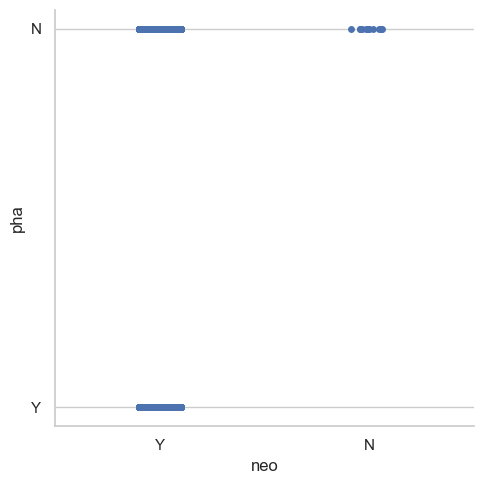

In [63]:
sns.catplot(x = "neo", y = "pha",
            data = filtered_neo)
plt.show()

 The above code generates a categorical plot using Seaborn to visualize the relationship between the 'neo' and 'pha' variables in the DataFrame filtered_neo.

It can be clearly seen from this graph that there is no potentially hazardous asteroid which is not a Near Earth Object.

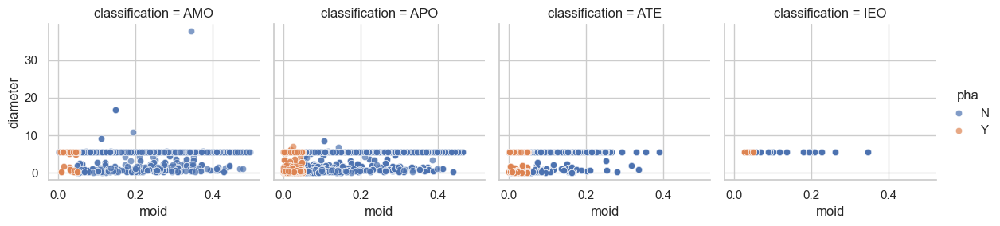

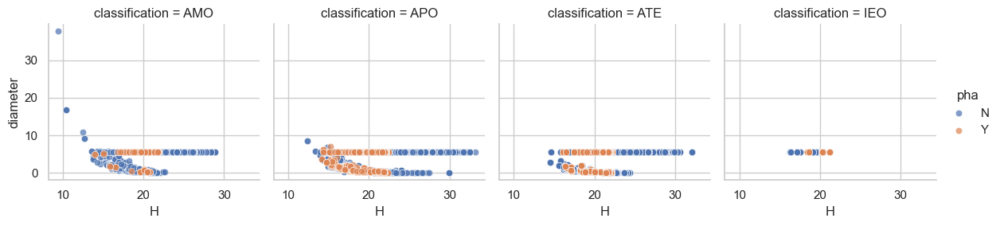

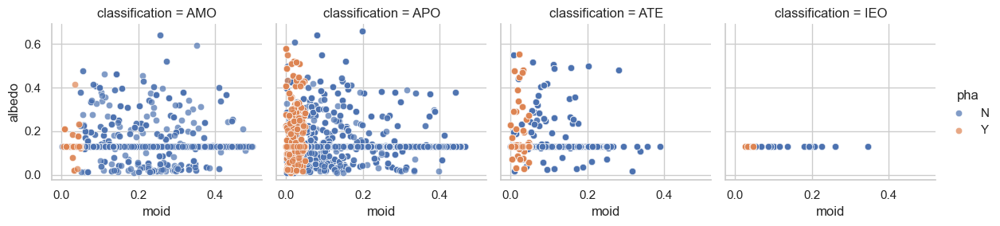

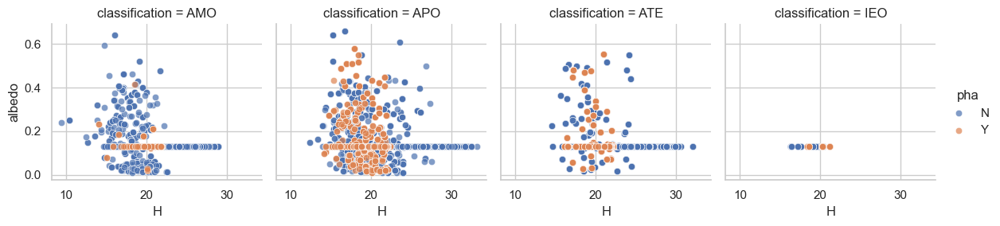

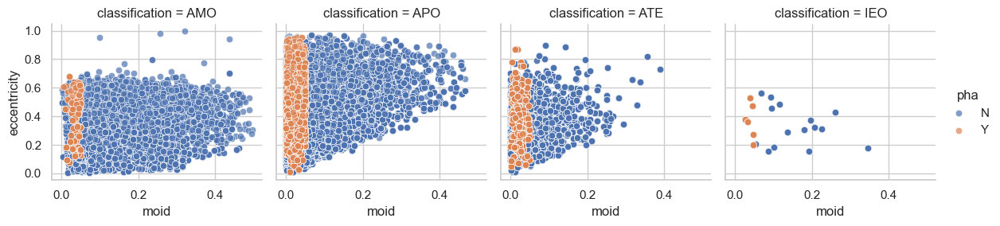

...

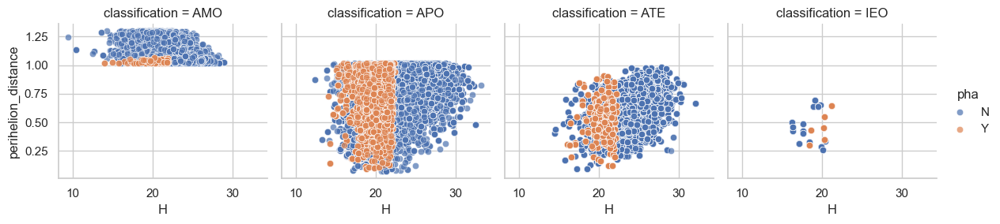

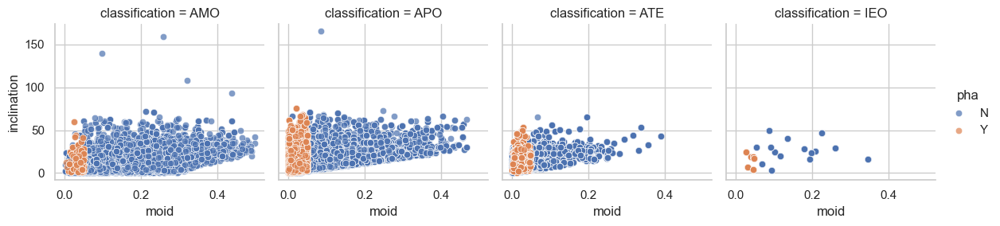

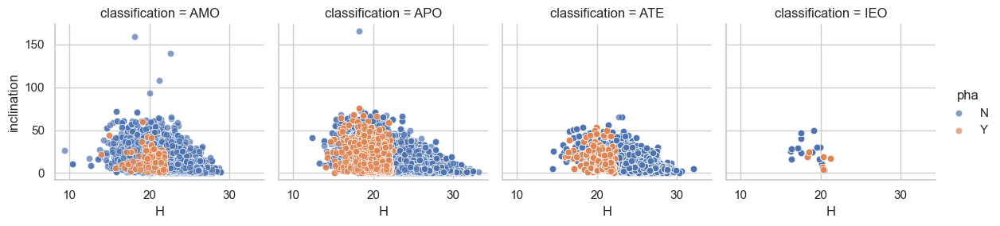

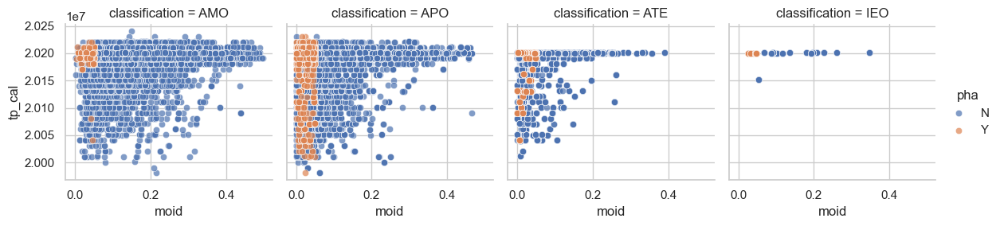

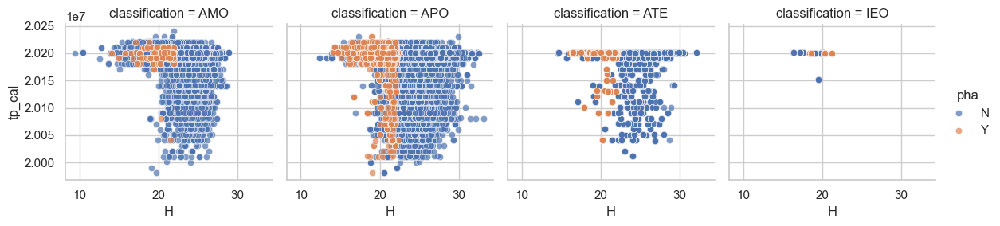

In [64]:
imp_features = ['diameter', 'albedo', 'eccentricity', 'semi_major_axis',
                'perihelion_distance', 'inclination', 'tp_cal']
plot_scatter(neo, imp_features)

For various classes of asteroids, the MOID and H against several parameters are plotted such as diameter, albedo, eccentricity (e), semi-major axis (a), perihelion distance (q), inclination angle with respect to x-y ecliptic plane (i), time of perihelion passage (tp_cal).

It is clearly observed that an asteroid is potentially hazardous only if MOID is less than 0.05 au and H is less than 22.0 holds true. Further it can be seen that for albedo, eccentricity and tp the plots are more scattered as compared to the other parameters.


In [65]:
other_features = ['om', 'w', 'ma',
                'ad', 'mean_motion', 'rms',
                'est_diameter_max', 'est_diameter_min',
                'relative_velocity', 'miss_distance']
neo[other_features].info()

<class 'pandas.core.frame.DataFrame'>
Index: 72475 entries, 0 to 72486
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   om                 72475 non-null  float64
 1   w                  72475 non-null  float64
 2   ma                 72475 non-null  float64
 3   ad                 72475 non-null  float64
 4   mean_motion        72475 non-null  float64
 5   rms                72475 non-null  float64
 6   est_diameter_max   72475 non-null  float64
 7   est_diameter_min   72475 non-null  float64
 8   relative_velocity  72475 non-null  float64
 9   miss_distance      72475 non-null  float64
dtypes: float64(10)
memory usage: 6.1 MB


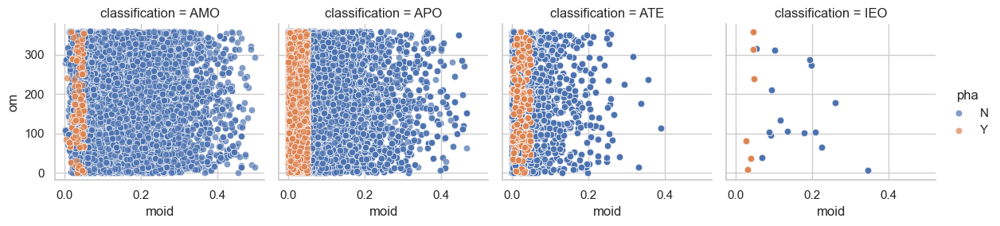

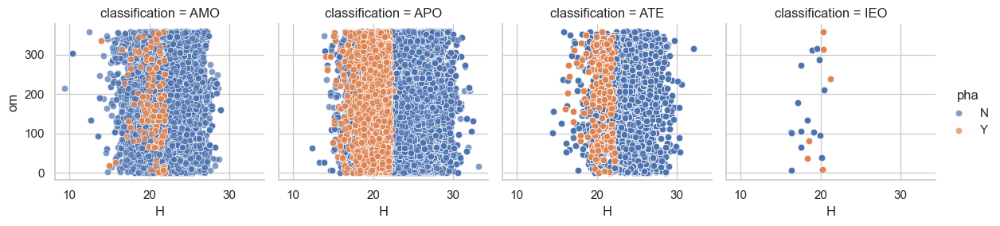

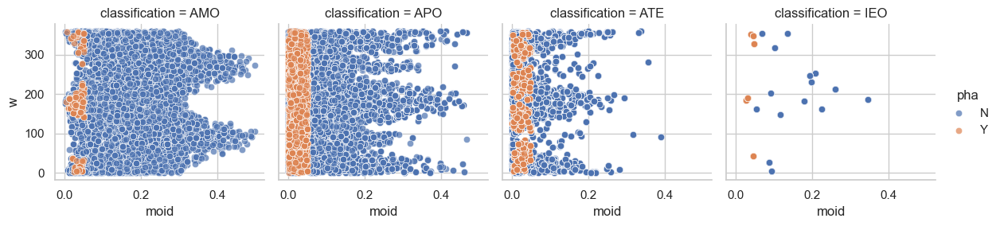

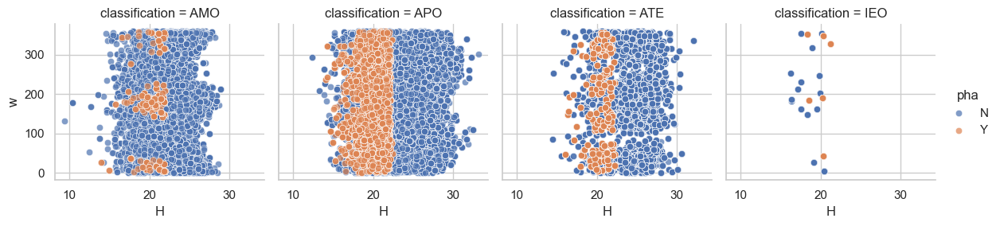

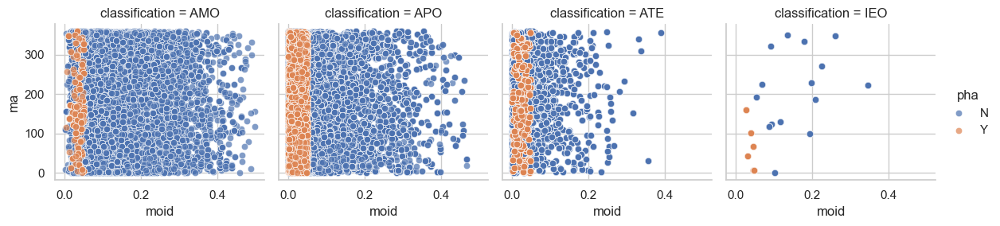

...

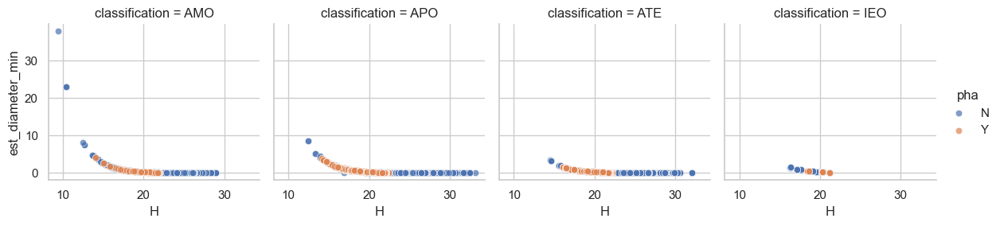

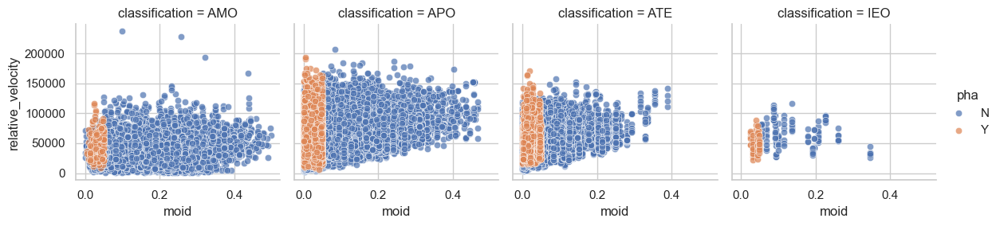

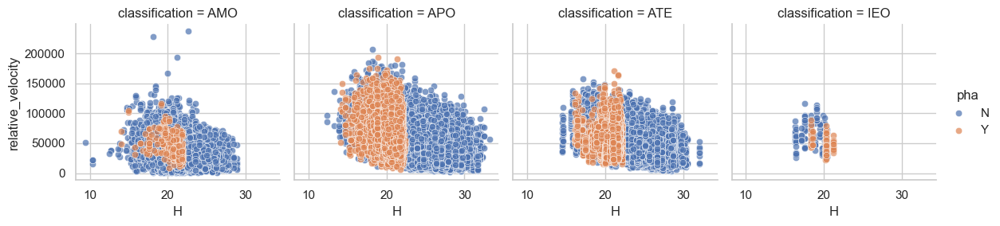

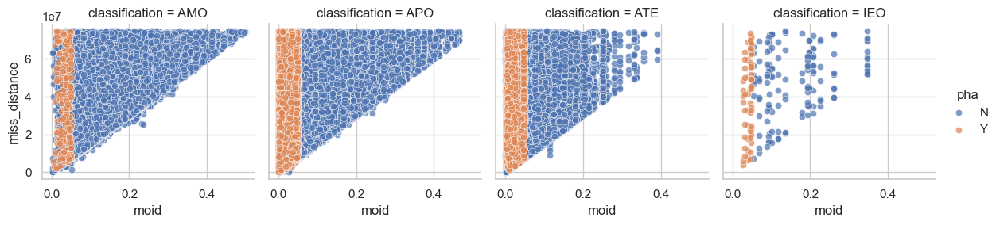

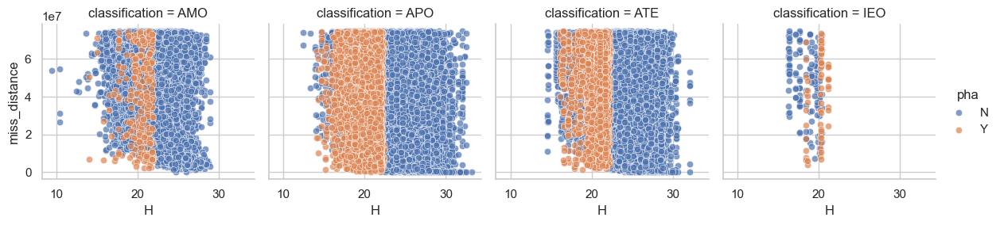

In [66]:
plot_scatter(neo, other_features)

It is observed that an asteroid is potentially hazardous only if MOID is less than 0.05 and H is less than 22.0, further, all these plots are more scattered compared to the previous set of plots.


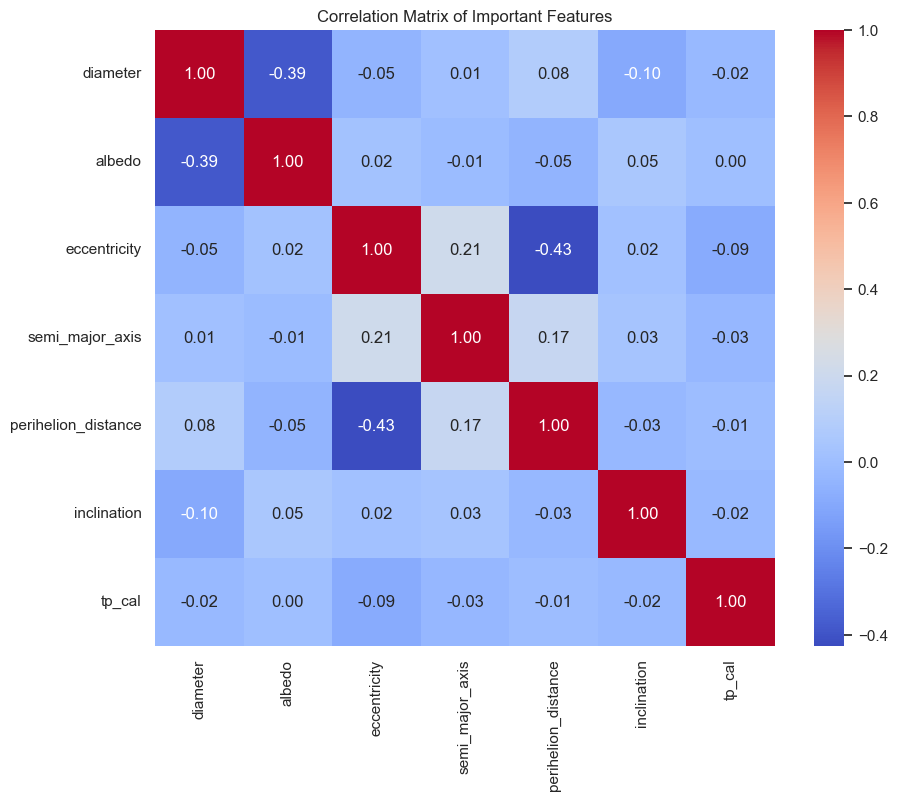

In [67]:
correlation_matrix = neo[imp_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Important Features")
plt.show()

To ensure that none of the features have too much covariance with one another, a heat map is plotted, and it shows that all the features have normal correlations with each other.

In [68]:
neo.describe()

,id,H,diameter,albedo,diameter_sigma,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,cluster
count,7.247500e+04,72475.000000,72475.000000,72475.000000,72475.000000,7.247500e+04,72475.000000,7.247500e+04,72475.000000,72475.000000,72475.000000,72475.000000,72475.000000,72475.000000,72475.000000,72475.000000,72475.000000,7.247500e+04,7.247500e+04,7.247500e+04,72475.000000,72475.000000,72475.000000,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,7.247500e+04,72475.000000,72475.000000,72475.000000,72475.000000,7.247500e+04,72475.000000,72475.000000
mean,4.882862e+06,23.195730,5.293072,0.133326,0.462720,2.458670e+06,58669.802677,2.019139e+07,0.373452,1.391552,0.817414,12.425568,173.317685,183.927744,176.828660,1.965690,0.742908,2.458666e+06,2.019057e+07,6.607441e+02,1.809019,0.071474,27.815481,9.376312e-04,5.002240e-03,5.020229e-04,3.489483e-02,3.830050e-02,8.726355e-02,3.614312e-01,8.678536e-03,9.917693e-04,5.241391e-01,1.588340e+01,0.778722,0.145100,0.324453,48713.673454,3.749501e+07,23.205395,0.745912
std,8.436757e+06,2.906309,1.011889,0.032277,0.085817,1.033325e+03,1033.325062,2.853896e+04,0.180056,1.420228,0.236115,10.486432,103.911490,103.934135,110.507802,2.809077,0.339872,1.051557e+03,2.891458e+04,9.012363e+03,24.674505,0.083799,32.612184,1.503833e-02,3.524721e-01,1.140007e-02,9.372784e-01,1.118107e+00,2.118776e+00,7.225739e+00,6.932666e-01,1.457816e-02,1.214063e+01,3.243501e+03,28.220122,0.328739,0.735084,25648.911669,2.218191e+07,2.898144,0.695707
min,2.000433e+06,9.400000,0.002500,0.009000,0.000500,2.450972e+06,50971.000000,1.998061e+07,0.002846,0.555418,0.070511,0.013518,0.025992,0.007924,0.005210,0.653773,0.000149,2.451026e+06,1.998073e+07,1.511918e+02,0.413941,0.000003,0.001331,1.285600e-10,4.026100e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,2.103800e-07,4.846400e-11,2.860900e-11,3.088400e-07,2.335200e-08,0.037189,0.000609,0.001362,271.446828,1.185167e+04,9.230000,0.000000
25%,3.367758e+06,21.000000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.233978,1.004212,0.645767,4.636922,81.604933,94.076687,75.865247,1.260147,0.474163,2.458807e+06,2.019112e+07,3.675670e+02,1.006344,0.010886,4.236524,2.901400e-07,2.745700e-08,3.188700e-07,2.532900e-05,3.336200e-05,7.897100e-05,9.417300e-05,3.867600e-08,2.038300e-08,1.217600e-04,1.826700e-05,0.399250,0.022108,0.049436,28997.701355,1.798774e+07,21.000000,0.000000
50%,3.683393e+06,23.300000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.355330,1.235914,0.844493,9.247266,175.022885,189.586809,173.707989,1.599221,0.717334,2.458956e+06,2.020042e+07,5.018579e+02,1.374012,0.036767,14.308691,5.076100e-05,4.244200e-05,1.140100e-05,8.334200e-04,2.676400e-04,9.629100e-04,2.369200e-02,5.486500e-05,4.033400e-05,1.556700e-02,2.492100e-02,0.473670,0.058151,0.130029,44855.909165,3.837230e+07,23.300000,1.000000
75%,3.789390e+06,25.400000,5.506429,0.130627,0.479184,2.459000e+06,59000.000000,2.020053e+07,0.499362,1.628736,0.997982,17.853756,255.387420,274.104763,278.053235,2.371099,0.979413,2.459093e+06,2.020083e+07,7.592322e+02,2.078664,0.104170,40.539839,3.807900e-04,4.738400e-04,1.412300e-04,9.763500e-03,2.125700e-03,8.972800e-03,2.206500e-01,6.322800e-04,3.755500e-04,2.281700e-01,2.995750e-01,0.553920,0.167708,0.375008,63728.155967,5.677756e+07,25.400000,1.000000
max,5.401723e+07,33.200000,37.675000,0.658000,2.155000,2.459000e+06,59000.000000,2.020053e+07,0.996476,352.628376,1.299988,165.541000,359.977940,359.982032,359.998040,704.014132,2.381082,2.460373e+06,2.024030e+07,2.418657e+06,6621.922401,0.497791,193.725323,2.145200e+00,8.466800e+01,1.50440

In [69]:
label_encoder = LabelEncoder()
new_df['neo'] = label_encoder.fit_transform(new_df['neo'])
new_df['pha'] = label_encoder.fit_transform(new_df['pha'])
new_df['classification'] = label_encoder.fit_transform(new_df['classification'])
new_df['orbit_id'] = label_encoder.fit_transform(new_df['orbit_id'])
new_df

,id,full_name,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,eccentricity,semi_major_axis,perihelion_distance,inclination,om,w,ma,ad,mean_motion,time_of_perihelion_passage,tp_cal,period_days,period_years,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,classification,rms,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous,cluster
0,2000433.0,433 Eros (1898 DQ),1,0,10.400,16.840000,0.250000,0.060000,197,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,0,0.27423,23.043847,51.527608,15884.252623,5.468808e+07,10.31,False,1
1,2000433.0,433 Eros (1898 DQ),1,0,10.400,16.840000,0.250000,0.060000,197,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,0,0.27423,23.043847,51.527608,21402.705247,2.672952e+07,10.31,False,1
2,2000433.0,433 Eros (1898 DQ),1,0,10.400,16.840000,0.250000,0.060000,197,2459000.5,59000.0,20200531.0,0.222951,1.458046,1.132973,10.830543,304.299327,178.882294,271.071732,1.783119,0.559819,2.459159e+06,2.020111e+07,643.065402,1.760617,0.148623,57.839613,1.285600e-10,9.645400e-11,2.616800e-10,4.087800e-08,2.163900e-07,2.439200e-07,3.784900e-07,1.179600e-10,5.555100e-11,6.918600e-07,6.381100e-08,0,0.27423,23.043847,51.527608,21761.703426,3.120592e+07,10.31,False,1
3,2000719.0,719 Albert (1911 MT),1,0,15.400,5.506429,0.130627,0.479184,344,2459000.5,59000.0,20200531.0,0.546558,2.638602,1.196452,11.567485,183.866950,156.176338,140.273422,4.080752,0.229955,2.458390e+06,2.018093e+07,1565.522356,4.286167,0.203482,79.189090,2.178400e-08,2.531300e-09,5.811600e-08,2.910800e-06,1.657500e-05,1.682700e-05,2.521300e-06,3.914800e-09,3.309000e-10,1.030600e-05,2.252800e-06,0,0.39148,2.044349,4.571303,27551.597194,4.258288e+07,15.57,False,1
4,2001036.0,1036 Ganymed (1924 TD),1,0,9.400,37.675000,0.238000,0.399000,213,2459000.5,59000.0,20200531.0,0.533046,2.664725,1.244303,26.677643,215.546826,132.364631,4.817745,4.085146,0.226582,2.458979e+06,2.020051e+07,1588.828164,4.349974,0.344956,134.246527,2.430100e-08,2.418900e-09,6.479000e-08,4.053800e-06,7.192300e-06,7.608300e-06,2.395500e-06,3.708300e-09,3.085200e-10,1.055200e-05,2.163400e-06,0,0.38253,37.892650,84.730541,51496.923293,5.372124e+07,9.23,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72482,54017232.0,(2020 KQ4),1,0,26.419,5.506429,0.130627,0.479184,237,2459000.5,59000.0,20200531.0,0.133246,1.065046,0.923133,4.922687,60.470005,106.428094,67.343617,1.206958,0.896709,2.458925e+06,2.020032e+07,401.467813,1.099159,0.002528,0.983884,5.850600e-04,4.001800e-04,2.768000e-04,2.169300e-02,2.846900e-03,3.581200e-02,9.711300e-02,4.535000e-04,5.053900e-04,6.599300e-02,2.262700e-01,1,0.45051,0.013322,0.029788,36362.157611,3.215916e+07,26.50,False,1
72483,54017232.0,(2020 KQ4),1,0,26.419,5.506429,0.130627,0.479184,237,2459000.5,59000.0,20200531.0,0.133246,1.065046,0.923133,4.922687,60.470005,106.428094,67.343617,1.206958,0.896709,2.458925e+06,2.020032e+07,401.467813,1.099159,0.002528,0.983884,5.850600e-04,4.001800e-04,2.768000e-04,2.169300e-02,2.846900e-03,3.581200e-02,9.711300e-02,4.535000e-04,5.053900e-04,6.599300e-02,2.262700e-01,1,0.45051,0.013322,0.029788,42345.471476,4.048559e+07,26.50,False,0
72484,54017232.0,(2020 KQ4),1,0,26.419,5.506429,0.130627,0.479184,237,2459000.5,5

After this code is executed, the specified categorical columns in new_df will be replaced with numerical labels obtained from the LabelEncoder. Each unique category in a column will be assigned a unique integer label.

# **Model Training**

In [70]:
# X contains all columns except 'hazardous' and 'full_name'
X = new_df.drop(['hazardous', 'full_name'], axis=1)
y = new_df['hazardous']

In [71]:
y.unique()

array([False,  True])

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, random_state=42)

decision_tree_model = DecisionTreeClassifier()
decision_tree_model.fit(X_train, y_train)

decision_tree_predictions = decision_tree_model.predict(
    X_test)

decision_tree_accuracy = accuracy_score(y_test, decision_tree_predictions)
print(f'Decision Tree Accuracy: {decision_tree_accuracy}')

Decision Tree Accuracy: 0.9997930749068837


In [73]:
ada_boost_model = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),
                                     random_state=42)
ada_boost_model.fit(X_train,y_train)

ada_predictions = ada_boost_model.predict(X_test)

ada_accuracy = accuracy_score(y_test, ada_predictions)
print(f'Ada Boost Accuracy: {ada_accuracy}')

Ada Boost Accuracy: 0.9997930749068837


In [74]:
from sklearn.linear_model import LogisticRegression
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)

logreg_predictions = logreg_model.predict(X_test)

logreg_accuracy = accuracy_score(y_test,
                                 logreg_predictions)
print(f'Logistic Regression Accuracy: {logreg_accuracy}')

Logistic Regression Accuracy: 0.8883983997792799


In [75]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

knn_predictions = knn_model.predict(X_test)

knn_accuracy = accuracy_score(y_test,
                              knn_predictions)
print(f'KNN Accuracy: {knn_accuracy}')

KNN Accuracy: 0.883708097668644


In [76]:
models = pd.DataFrame({
    'Model': ['DecisionTreeClassifier','AdaBoostClassifier',
              'LogisticRegression', 'KNN'],
    'Score': [decision_tree_accuracy, ada_accuracy,
              logreg_accuracy, knn_accuracy]
})

models.sort_values(by='Score', ascending=False)

,Model,Score
0,DecisionTreeClassifier,0.999793
1,AdaBoostClassifier,0.999793
2,LogisticRegression,0.888398
3,KNN,0.883708


# **Parameter Tuning**

In [77]:
models = {
    'DecisionTree': DecisionTreeClassifier(),
    'AdaBoost': AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(), random_state=42),
    'LogisticRegression': LogisticRegression(),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

param_grid = {
    'DecisionTree': {'max_depth': [None, 10, 20, 30]},
    'AdaBoost': {'n_estimators': [50, 100, 200],
                 'learning_rate': [0.01, 0.1, 0.2]},
    'LogisticRegression': {'C': [0.1, 1, 10],
                           "penalty": ["l1", "l2"],
                           "solver": ["liblinear"]},
    'KNN': {'n_neighbors': [3, 5, 7, 10]},

}

for model_name, model in models.items():
    grid_search = GridSearchCV(model, param_grid[model_name],
                               cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    print(f"Best parameters for {model_name}:{grid_search.best_params_}")

Best parameters for DecisionTree:{'max_depth': 20}
Best parameters for AdaBoost:{'learning_rate': 0.01, 'n_estimators': 50}
Best parameters for LogisticRegression:{'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
Best parameters for KNN:{'n_neighbors': 10}


Grid Search is used here to find the optimal hyperparameters for each model in the provided dictionary. It helps in fine-tuning the models to improve their performance on the given dataset. The best hyperparameters for each model are printed out after the grid search is completed.

# **Model Evaluation**

In [79]:
best_models = {}
for model_name, model in models.items():
    grid_search = GridSearchCV(model,
                               param_grid[model_name],
                               cv=5, scoring='accuracy')
    grid_search.fit(X_train,
                    y_train)
    best_models[model_name] = grid_search.best_estimator_

for model_name, model in best_models.items():
    # Confusion Matrix
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print(f"\nConfusion Matrix for {model_name}:\n{cm}")

    # Classification Report
    print(f"\nClassification Report for {model_name}:\n{classification_report(y_test,y_pred)}")


Confusion Matrix for DecisionTree:
[[12891     5]
 [    1  1601]]

Classification Report for DecisionTree:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00     12896
        True       1.00      1.00      1.00      1602

    accuracy                           1.00     14498
   macro avg       1.00      1.00      1.00     14498
weighted avg       1.00      1.00      1.00     14498


Confusion Matrix for AdaBoost:
[[12894     2]
 [    1  1601]]

Classification Report for AdaBoost:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00     12896
        True       1.00      1.00      1.00      1602

    accuracy                           1.00     14498
   macro avg       1.00      1.00      1.00     14498
weighted avg       1.00      1.00      1.00     14498


Confusion Matrix for LogisticRegression:
[[12875    21]
 [    7  1595]]

Classification Report for LogisticRegression:
              prec

Evaluating the performance of the best-tuned models on a separate test set, providing insights into how well each model generalizes to new, unseen data. The confusion matrix and classification report offer a detailed view of the model's performance across different classes.

# **Ensemble using Voting Classifier**

In [80]:
# Create a voting classifier (hard voting)
voting_clf_hard = VotingClassifier(
    estimators=[('dt', decision_tree_model), ('ab', ada_boost_model),
                ('lr', logreg_model),('knn',knn_model)],
    voting='hard'
)

# Create a voting classifier (soft voting)
voting_clf_soft = VotingClassifier(
    estimators=[('dt', decision_tree_model), ('ab', ada_boost_model),
                ('lr', logreg_model),('knn',knn_model)],
    voting='soft'
)

# Fit the classifiers
voting_clf_hard.fit(X_train, y_train)
voting_clf_soft.fit(X_train, y_train)

# Make predictions
y_pred_hard = voting_clf_hard.predict(X_test)
y_pred_soft = voting_clf_soft.predict(X_test)

# Evaluate accuracy
accuracy_hard = accuracy_score(y_test, y_pred_hard)
accuracy_soft = accuracy_score(y_test, y_pred_soft)

print(f'Accuracy (Hard Voting): {accuracy_hard:.4f}')
print(f'Accuracy (Soft Voting): {accuracy_soft:.4f}')

Accuracy (Hard Voting): 0.9091
Accuracy (Soft Voting): 0.9992
